In [ ]:
!pip install xgboost shap

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Load data dari file Excel
file_path = 'Data Kualitas Udara Jakarta.xlsx'
data = pd.read_excel(file_path, sheet_name='All')
data.head(10)

,periode_data,tanggal,pm10,pm2.5,so2,co,o3,no2,max,critical,categori,stasiun
0,202112,2021-12-03,49.0,31.0,9.0,19.0,7.0,49.0,NaN,PM2.5,BAIK,DKI1
1,202309,2023-09-28,163.0,287.0,29.0,17.0,29.0,19.0,287.0,PM2.5,SANGAT TIDAK SEHAT,DKI4
2,202309,2023-09-26,85.0,249.0,28.0,18.0,26.0,20.0,249.0,PM2.5,SANGAT TIDAK SEHAT,DKI4
3,202309,2023-09-27,0.0,217.0,28.0,22.0,23.0,22.0,217.0,PM2.5,SANGAT TIDAK SEHAT,DKI4
4,202402,2024-02-14,43.0,55.0,51.0,10.0,20.0,202.0,202.0,NaN,SANGAT TIDAK SEHAT,DKI3
5,202310,2023-10-01,126.0,199.0,29.0,26.0,27.0,25.0,199.0,PM2.5,TIDAK SEHAT,DKI4
6,202402,2024-02-13,57.0,72.0,52.0,14.0,18.0,187.0,187.0,NaN,TIDAK SEHAT,DKI3
7,202208,2022-08-16,61.0,89.0,51.0,15.0,181.0,33.0,181.0,O3,TIDAK SEHAT,DKI2
8,202112,2021-12-07,179.0,58.0,39.0,9.0,17.0,15.0,179.0,PM10,TIDAK SEHAT,DKI4
9,202107,2021-07-15,95.0,174.0,40.0,15.0,22.0,24.0,174.0,PM2.5,TIDAK SEHAT,DKI4


# Analisis Statistika & Visualisasi

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5839 entries, 0 to 5838
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   periode_data  5839 non-null   int64         
 1   tanggal       5839 non-null   datetime64[ns]
 2   pm10          5770 non-null   float64       
 3   pm2.5         5827 non-null   float64       
 4   so2           5836 non-null   float64       
 5   co            5836 non-null   float64       
 6   o3            5834 non-null   float64       
 7   no2           5835 non-null   float64       
 8   max           5837 non-null   float64       
 9   critical      5773 non-null   object        
 10  categori      5839 non-null   object        
 11  stasiun       5839 non-null   object        
dtypes: datetime64[ns](1), float64(7), int64(1), object(3)
memory usage: 547.5+ KB


In [ ]:
data.describe()

,periode_data,tanggal,pm10,pm2.5,so2,co,o3,no2,max
count,5839.000000,5839,5770.000000,5827.000000,5836.000000,5836.000000,5834.000000,5835.000000,5837.000000
mean,202266.243192,2023-02-01 12:42:02.897756416,50.558579,72.782221,37.536155,13.972755,30.368186,21.718081,77.062018
min,202101.000000,2021-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,202110.000000,2021-10-19 12:00:00,41.000000,59.000000,26.000000,9.000000,19.000000,13.000000,61.000000
50%,202304.000000,2023-04-26 00:00:00,54.000000,76.000000,39.000000,12.000000,27.000000,19.000000,77.000000
75%,202403.000000,2024-03-13 12:00:00,63.000000,91.000000,51.000000,18.000000,38.000000,28.000000,91.000000
max,202411.000000,2024-11-30 00:00:00,187.000000,287.000000,112.000000,70.000000,181.000000,202.000000,287.000000
std,121.862706,NaN,19.016751,29.861600,15.717468,7.165119,16.961545,13.143242,23.457082


In [ ]:
data.mode()

,periode_data,tanggal,pm10,pm2.5,so2,co,o3,no2,max,critical,categori,stasiun
0,202407.0,2024-07-19,0.0,0.0,51.0,11.0,24.0,17.0,77.0,PM2.5,SEDANG,DKI4
1,NaN,2024-07-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2024-07-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,2024-07-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,2024-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,2024-07-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,2024-07-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,2024-07-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,2024-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,2024-07-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
data['categori'].value_counts()

,count
categori,
SEDANG,4445
TIDAK SEHAT,820
BAIK,527
TIDAK ADA DATA,43
SANGAT TIDAK SEHAT,4


In [ ]:
data['stasiun'].value_counts()

,count
stasiun,
DKI4,1362
DKI2,1135
DKI5,1131
DKI3,1129
DKI1,1082


In [ ]:
# Cek nilai yang hilang
data.isnull().sum()

,0
periode_data,0
tanggal,0
pm10,69
pm2.5,12
so2,3
co,3
o3,5
no2,4
max,2
critical,66


In [ ]:
(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,301
pm2.5,403
so2,159
co,89
o3,102
no2,118
max,42
critical,13


In [ ]:
# Menampilkan data pada baris ke-535
print(data.iloc[5051])

periode_data                 202407
tanggal         2024-07-04 00:00:00
pm10                            NaN
pm2.5                          84.0
so2                            30.0
co                             29.0
o3                              NaN
no2                            25.0
max                            84.0
critical                       PM25
categori                     SEDANG
stasiun                        DKI5
Name: 5051, dtype: object


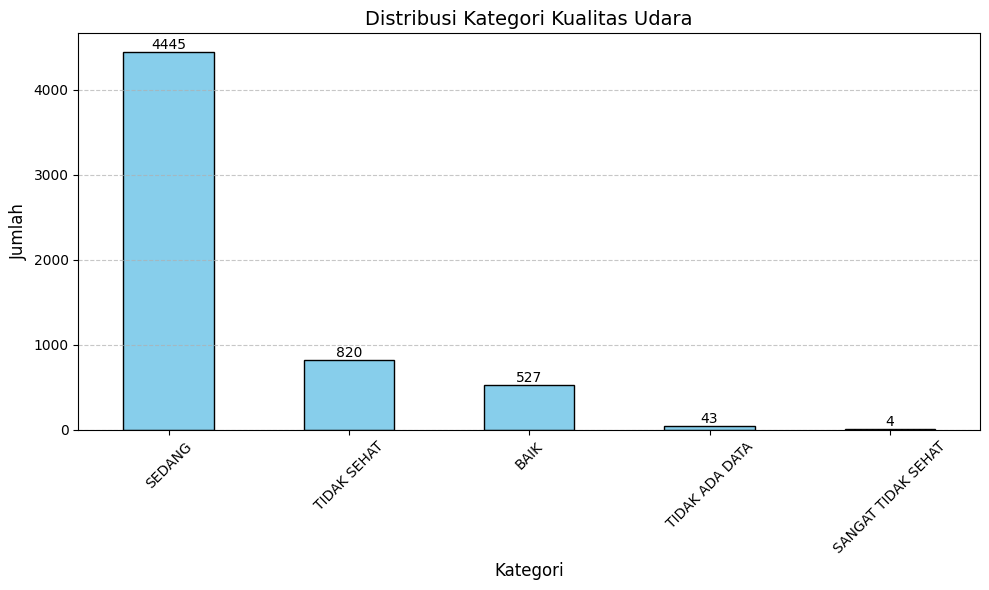

In [ ]:
kategori_counts = data['categori'].value_counts()

# Membuat barchart
plt.figure(figsize=(10,6))
kategori_counts.plot(kind='bar', color='skyblue', edgecolor='black')

# Menambahkan judul dan label
plt.title('Distribusi Kategori Kualitas Udara', fontsize=14)
plt.xlabel('Kategori', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Menampilkan nilai di atas setiap batang
for i, val in enumerate(kategori_counts.values):
    plt.text(i, val + 0.5, str(val), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['pm10'] = data['pm10'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['pm10'] = knn_imputer.fit_transform(data[['pm10']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,403
so2,159
co,89
o3,102
no2,118
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['pm2.5'] = data['pm2.5'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['pm2.5'] = knn_imputer.fit_transform(data[['pm2.5']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,159
co,89
o3,102
no2,118
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['so2'] = data['so2'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['so2'] = knn_imputer.fit_transform(data[['so2']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,0
co,89
o3,102
no2,118
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['co'] = data['co'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['co'] = knn_imputer.fit_transform(data[['co']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,0
co,0
o3,102
no2,118
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['o3'] = data['o3'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['o3'] = knn_imputer.fit_transform(data[['o3']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,0
co,0
o3,0
no2,118
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['no2'] = data['no2'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['no2'] = knn_imputer.fit_transform(data[['no2']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,0
co,0
o3,0
no2,0
max,42
critical,13


In [ ]:
from sklearn.impute import KNNImputer

# Step 1: Replace zeros with NaN in the 'critical' column
data['max'] = data['max'].replace(0, np.nan)

# Step 2: Initialize the KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Step 3: Apply the KNN imputer to the column (reshape the data to be 2D)
data['max'] = knn_imputer.fit_transform(data[['max']])

(data==0).sum()

,0
periode_data,0
tanggal,0
pm10,0
pm2.5,0
so2,0
co,0
o3,0
no2,0
max,0
critical,13


In [ ]:
# Menampilkan data pada baris ke-535
print(data.iloc[5051])

periode_data                 202407
tanggal         2024-07-04 00:00:00
pm10                      53.341196
pm2.5                          84.0
so2                            30.0
co                             29.0
o3                        30.908583
no2                            25.0
max                            84.0
critical                       PM25
categori                     SEDANG
stasiun                        DKI5
Name: 5051, dtype: object


In [ ]:
from sklearn.preprocessing import LabelEncoder
# Menggunakan replace untuk mengganti nilai
data['critical'] = data['critical'].fillna(data['critical'].mode()[0])
data['critical'] = data['critical'].replace({'PM10': 1, 'PM2.5': 2, 'SO2':3, 'CO':4, 'O3':5,  'NO2':6})

# Label encoding untuk kolom kategorikal
label_encoder = LabelEncoder()
data['stasiun'] = label_encoder.fit_transform(data['stasiun'].astype(str))
data['categori'] = label_encoder.fit_transform(data['categori'].astype(str))

data.head(100)
# Simpan hasil ke dalam file Excel
data.to_excel("hasil_preprocessing.xlsx", index=False)

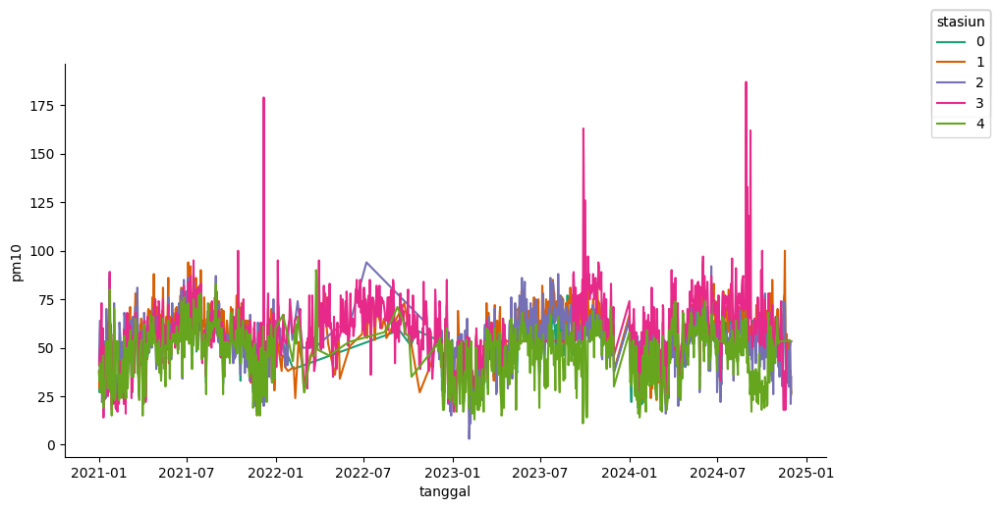

In [ ]:
# @title tanggal vs pm10
import matplotlib.pyplot as plt
import seaborn as sns

def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['pm10']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('pm10')

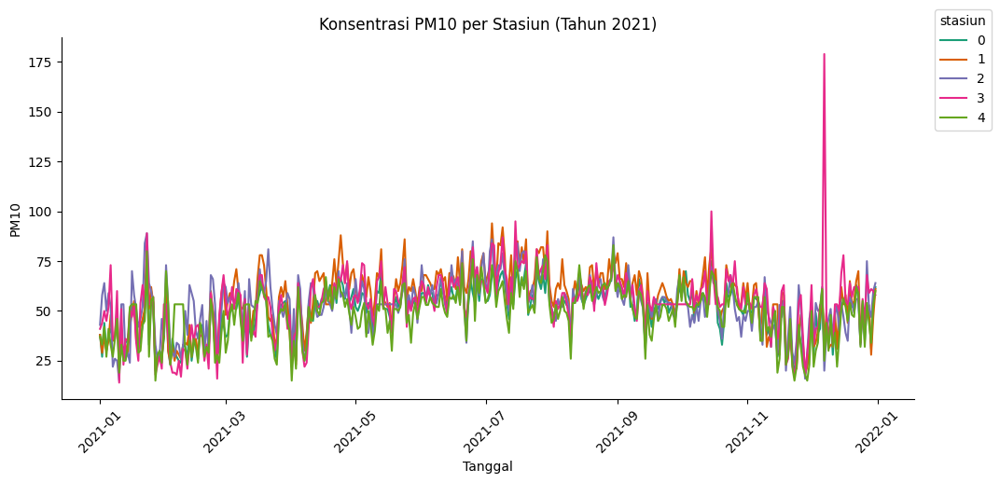

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm10']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM10')
plt.title('Konsentrasi PM10 per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

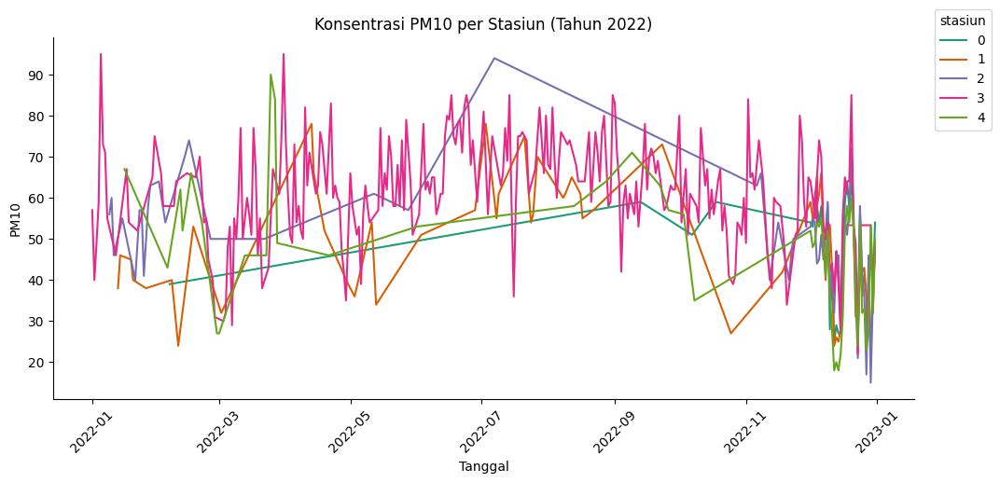

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm10']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM10')
plt.title('Konsentrasi PM10 per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

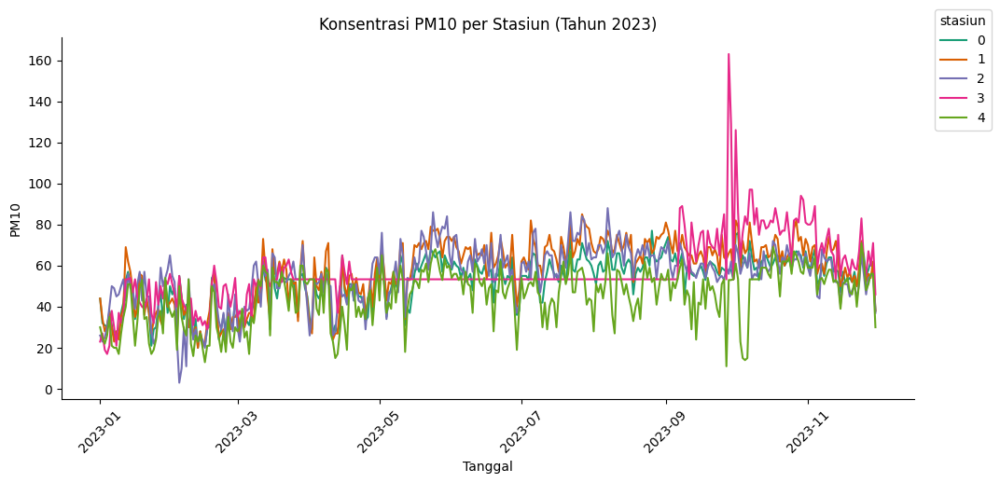

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2023
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm10']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2023.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM10')
plt.title('Konsentrasi PM10 per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

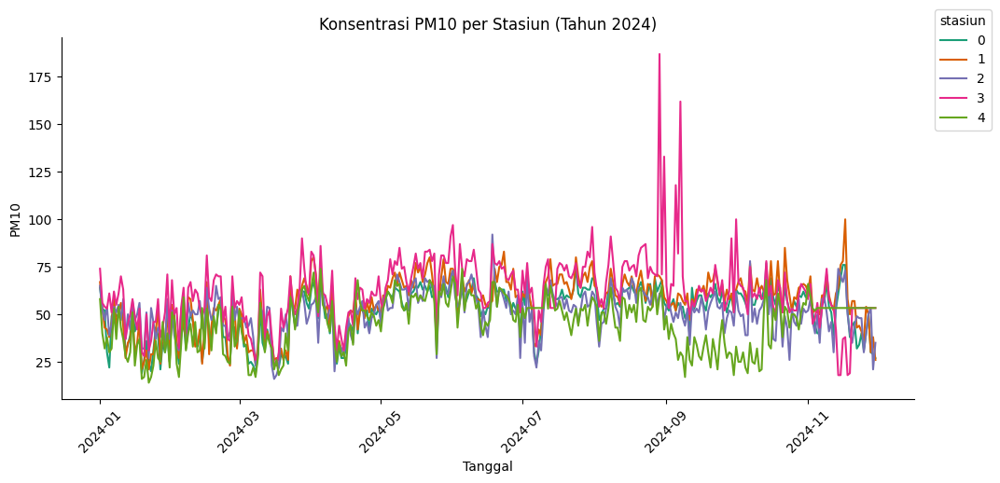

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm10']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM10')
plt.title('Konsentrasi PM10 per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

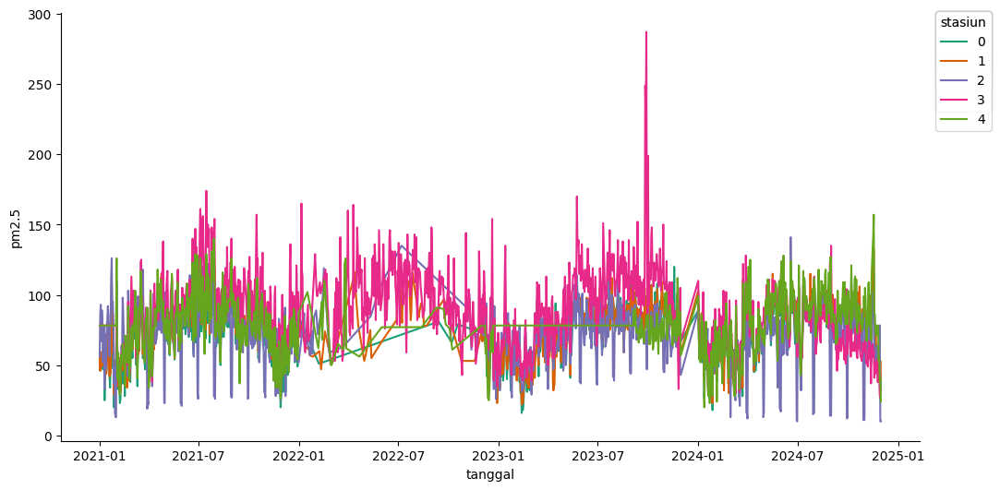

In [ ]:
# @title tanggal vs pm2.5
import matplotlib.pyplot as plt
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['pm2.5']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('pm2.5')

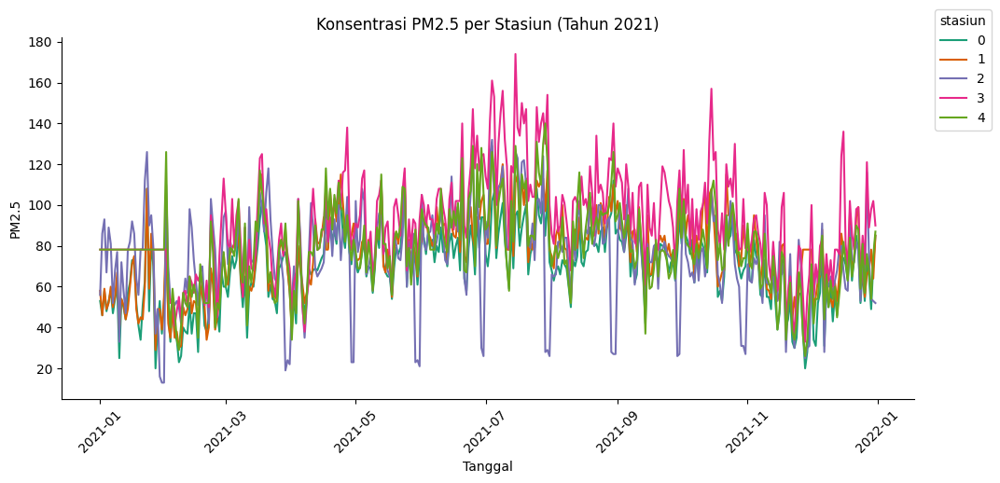

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm2.5']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM2.5')
plt.title('Konsentrasi PM2.5 per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

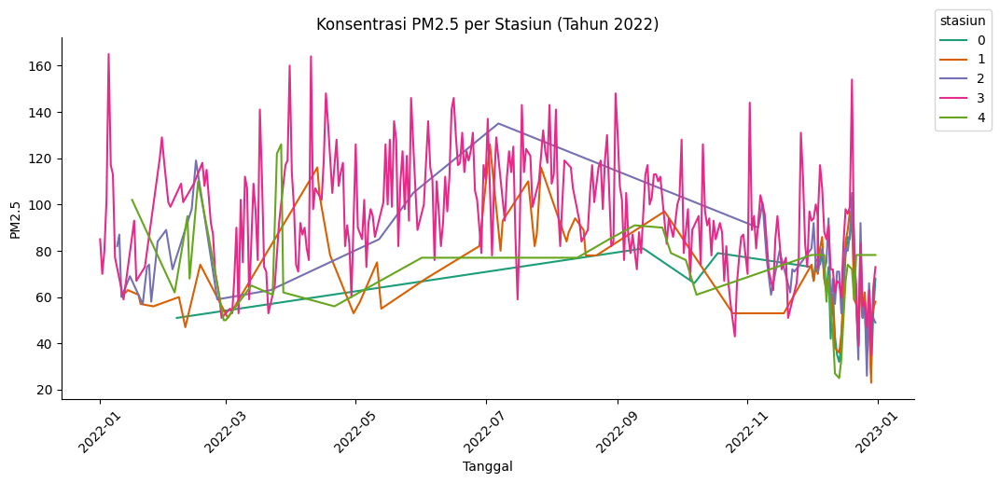

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm2.5']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM2.5')
plt.title('Konsentrasi PM2.5 per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

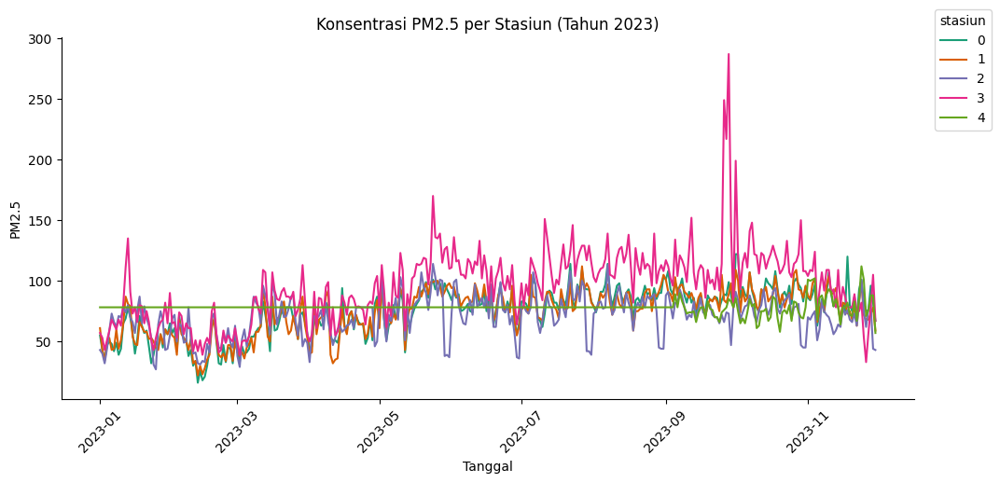

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2023
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm2.5']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2023.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM2.5')
plt.title('Konsentrasi PM2.5 per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

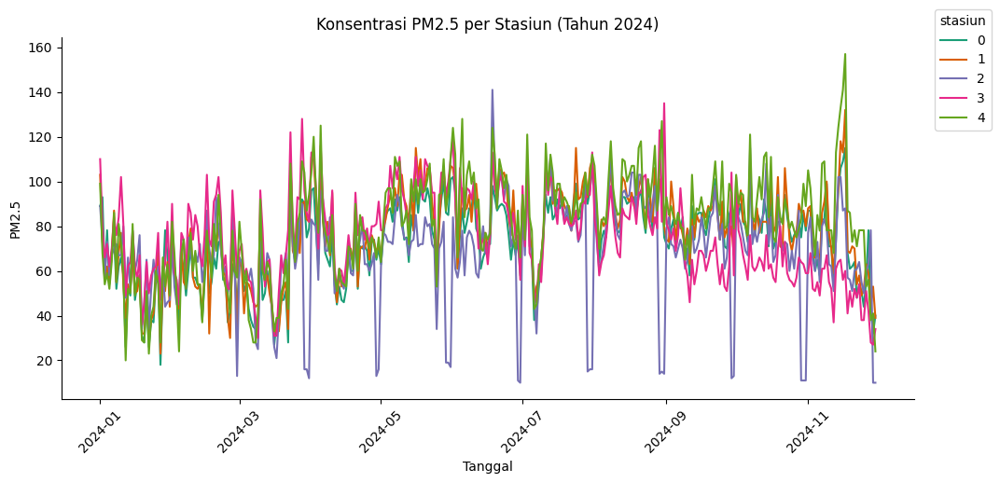

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['pm2.5']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('PM2.5')
plt.title('Konsentrasi PM2.5 per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

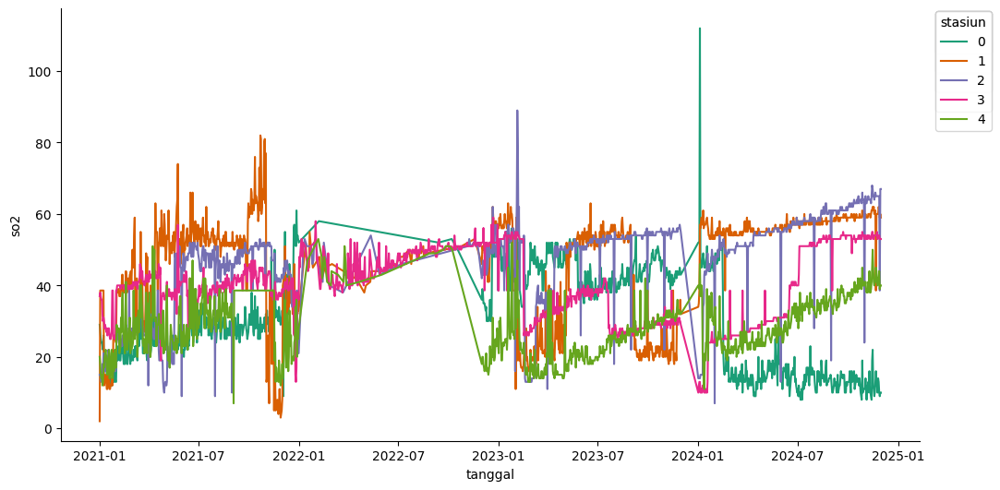

In [ ]:
# @title tanggal vs s02

def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['so2']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('so2')

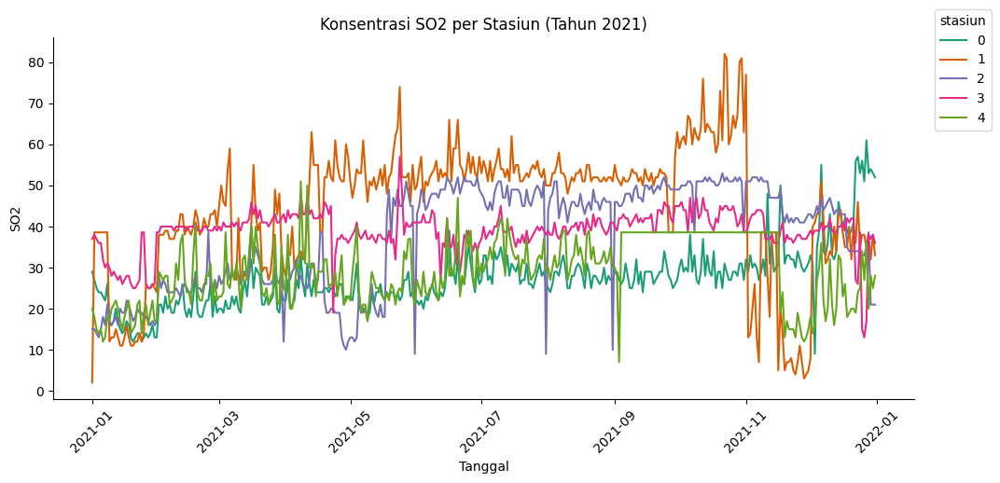

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['so2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('SO2')
plt.title('Konsentrasi SO2 per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

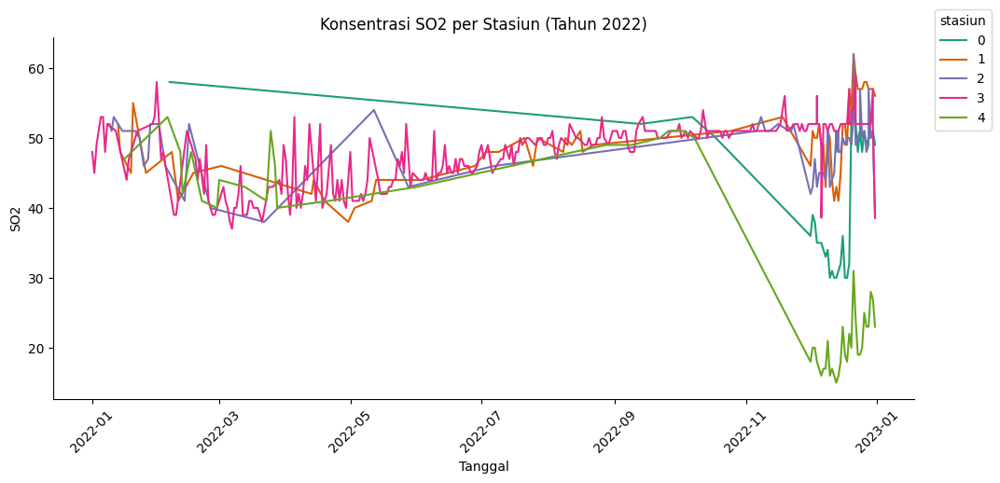

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['so2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('SO2')
plt.title('Konsentrasi SO2 per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

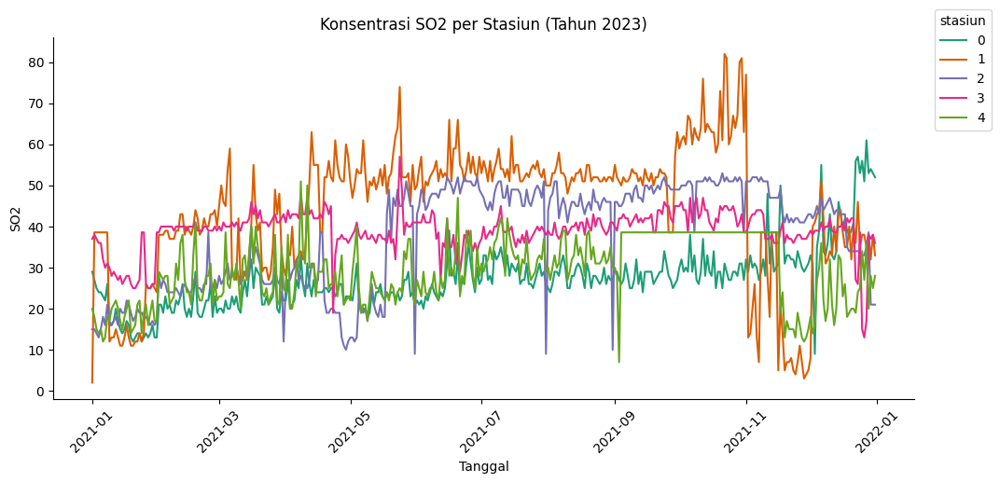

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2023
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['so2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('SO2')
plt.title('Konsentrasi SO2 per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

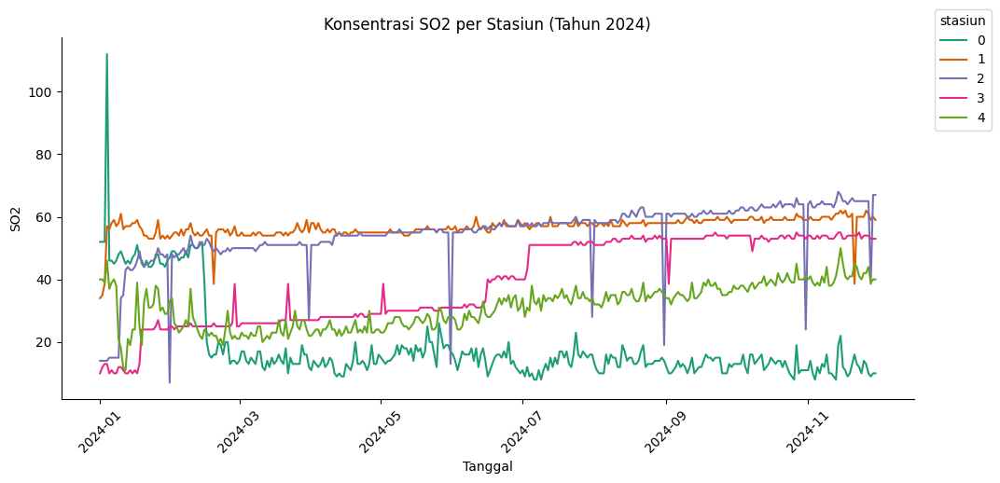

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['so2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('SO2')
plt.title('Konsentrasi SO2 per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

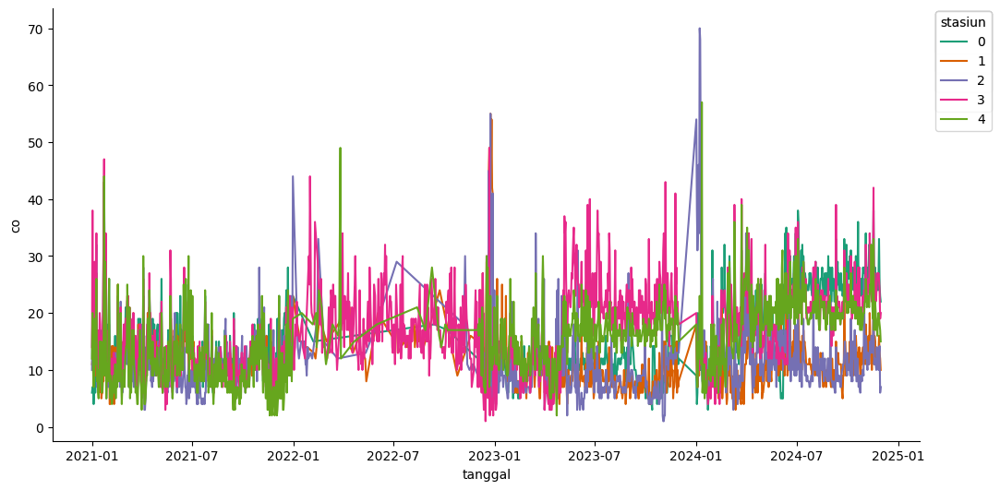

In [ ]:
# @title tanggal vs co

def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['co']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('co')

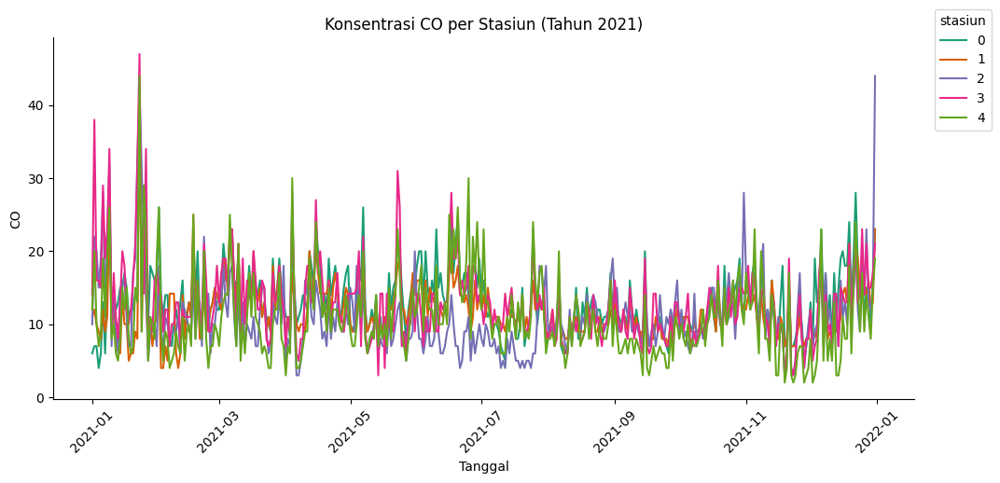

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

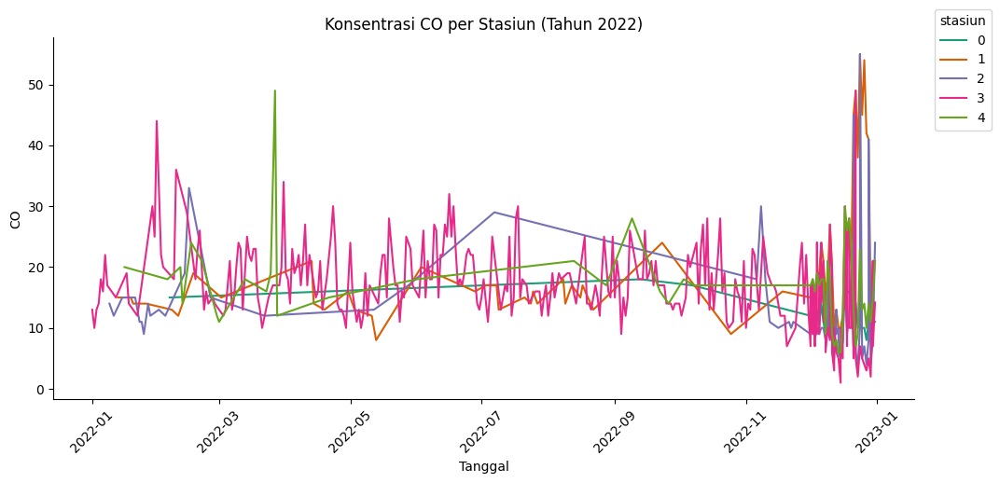

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

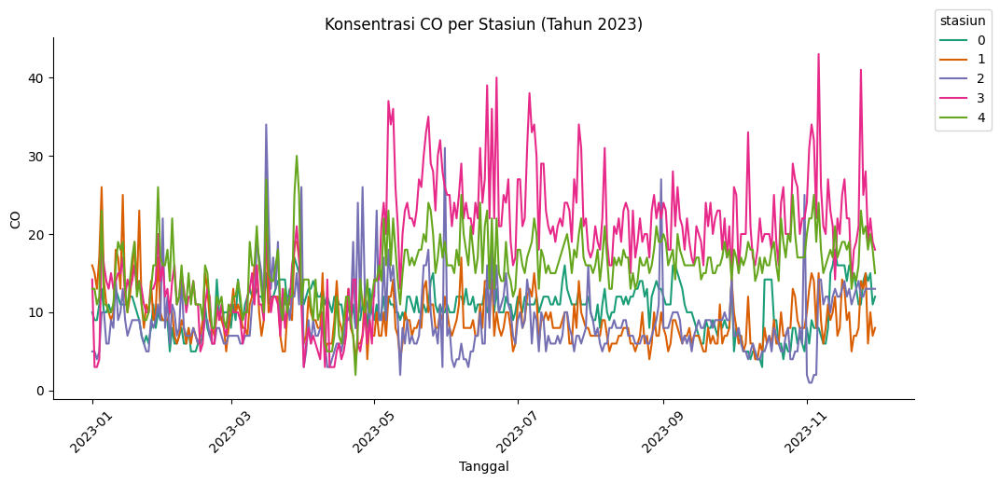

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2023
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2023.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

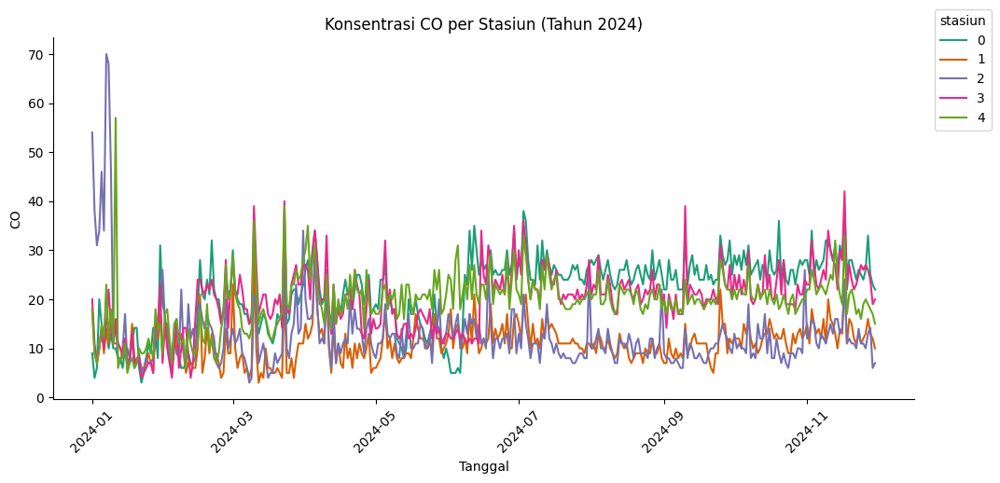

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

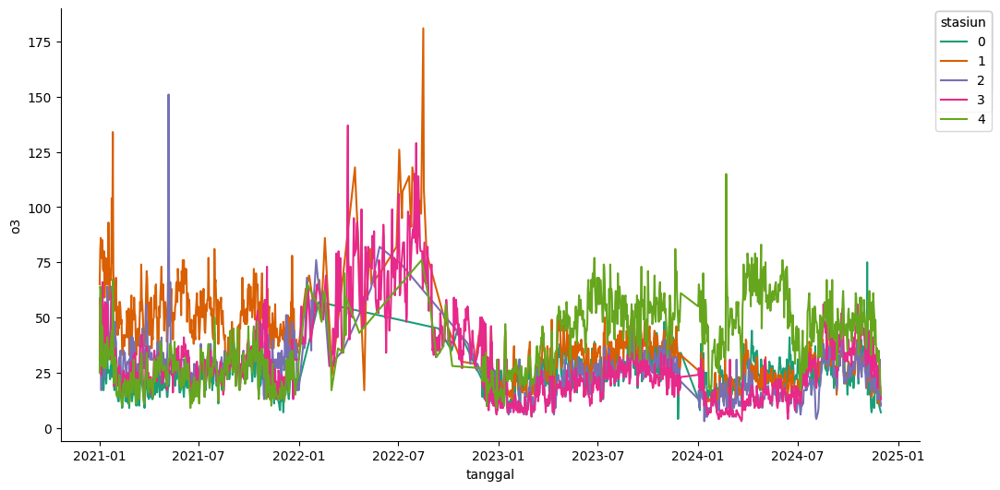

In [ ]:
# @title tanggal vs o3

def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['o3']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('o3')

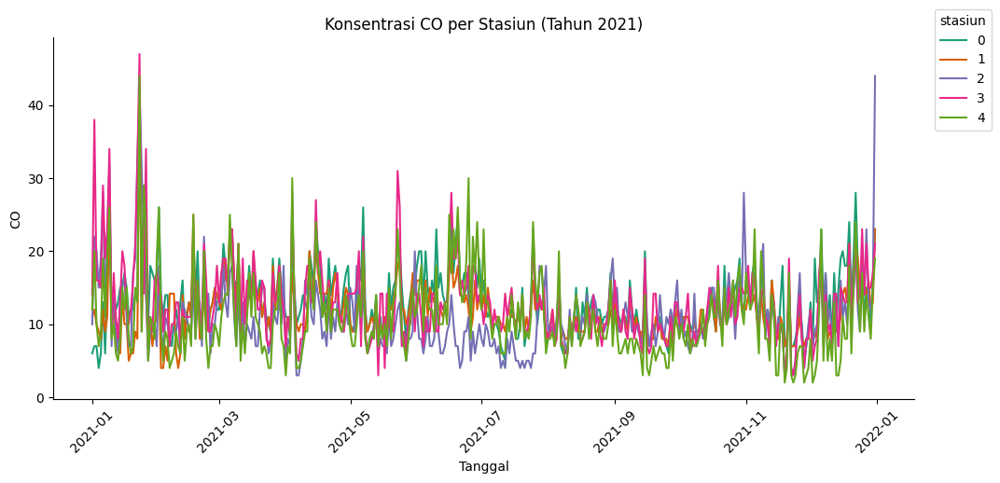

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

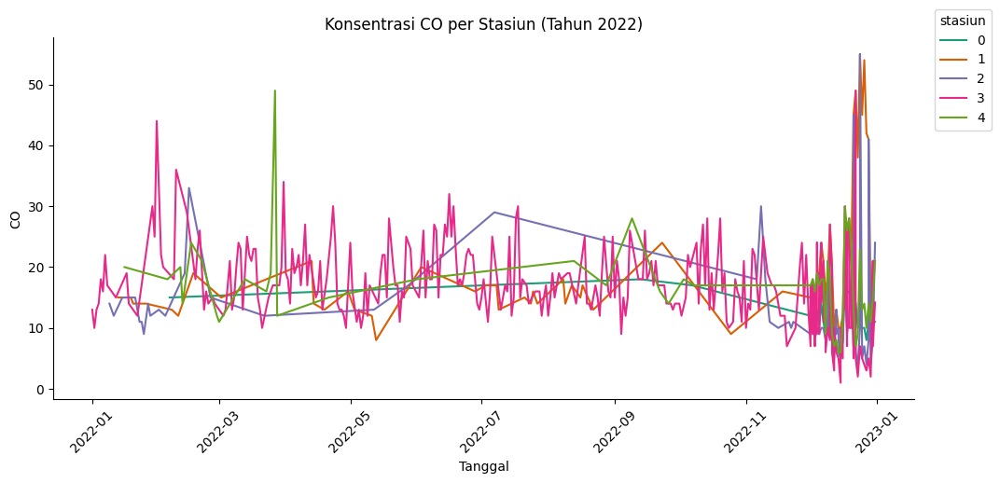

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

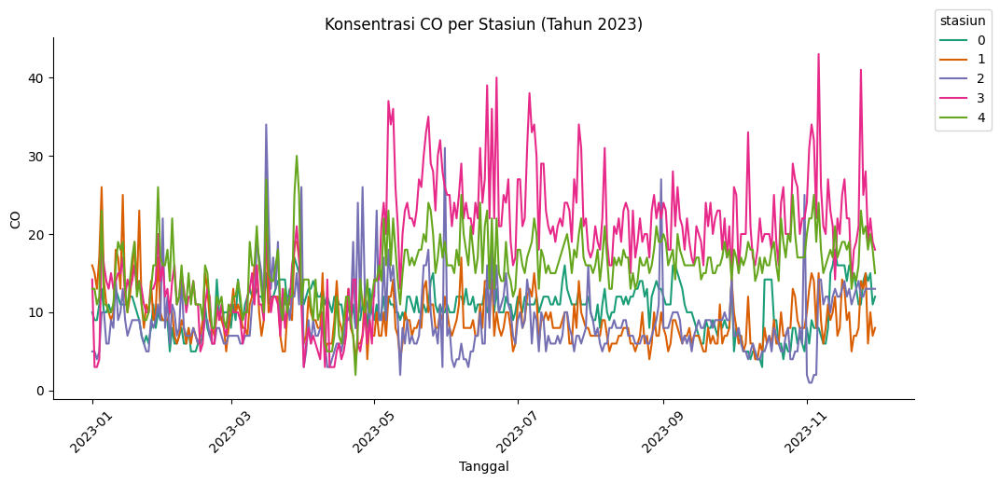

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2023
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2023.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

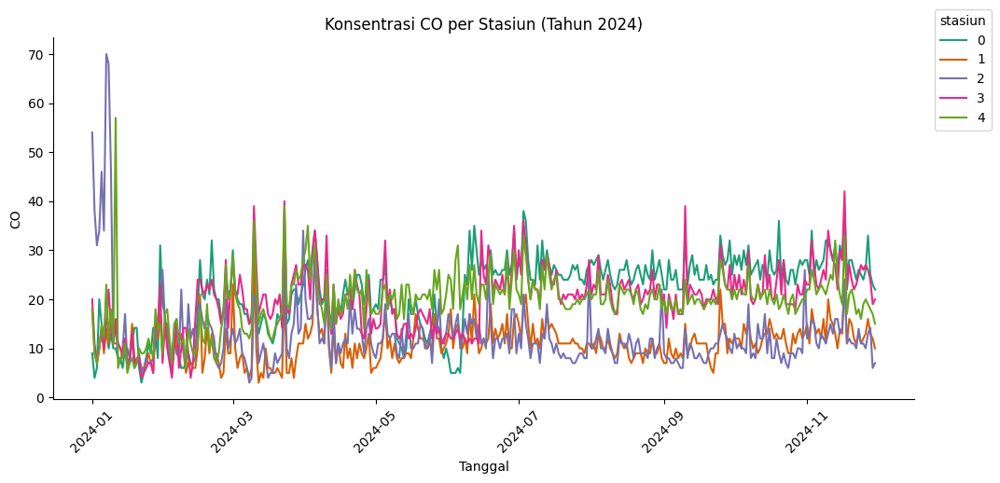

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['co']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('CO')
plt.title('Konsentrasi CO per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

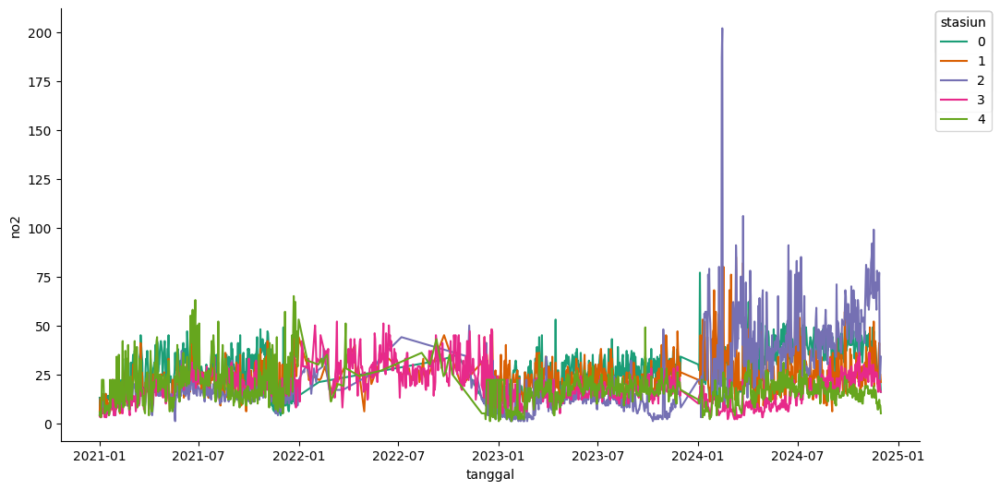

In [ ]:
# @title tanggal vs no2

def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['tanggal']
  ys = series['no2']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = data.sort_values('tanggal', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
  _plot_series(series, series_name, i)
  fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('tanggal')
_ = plt.ylabel('no2')

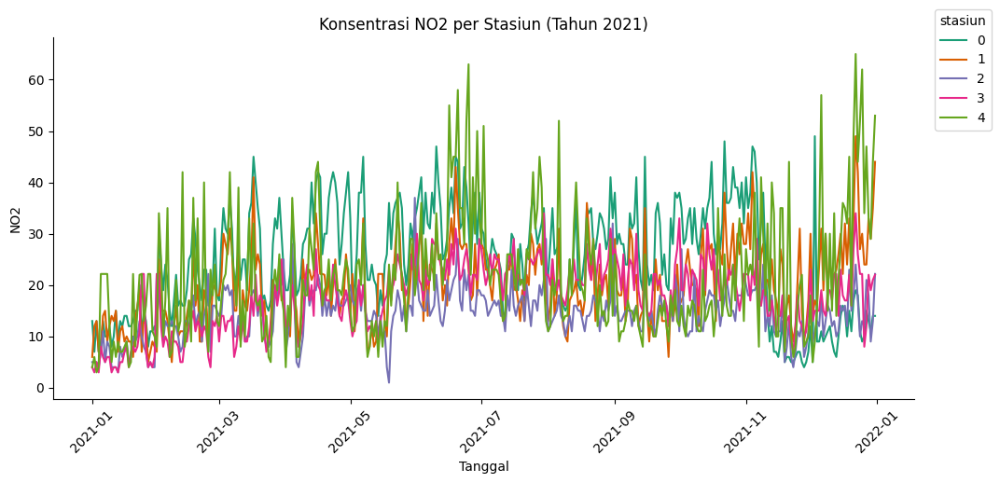

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2021 = data[data['tanggal'].dt.year == 2021].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['no2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2021.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('NO2')
plt.title('Konsentrasi NO2 per Stasiun (Tahun 2021)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

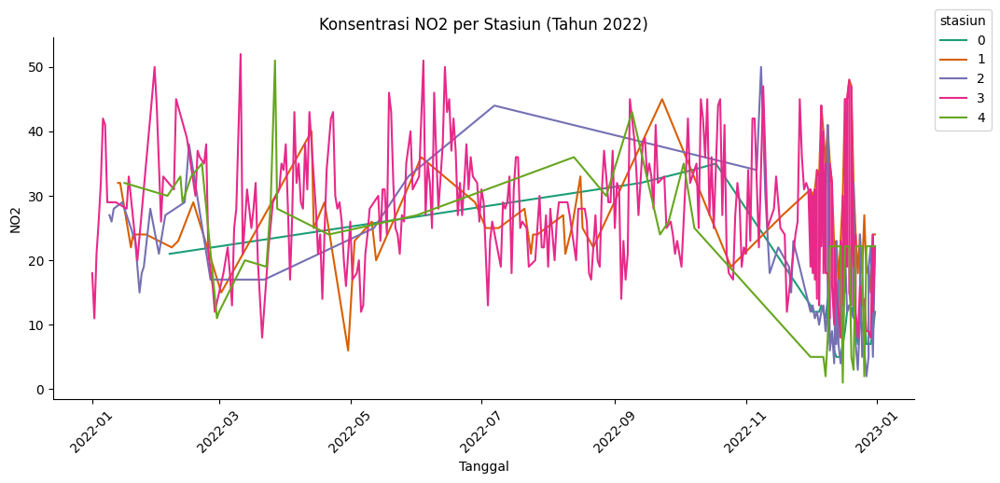

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2022
data_2022 = data[data['tanggal'].dt.year == 2022].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['no2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2022.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('NO2')
plt.title('Konsentrasi NO2 per Stasiun (Tahun 2022)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

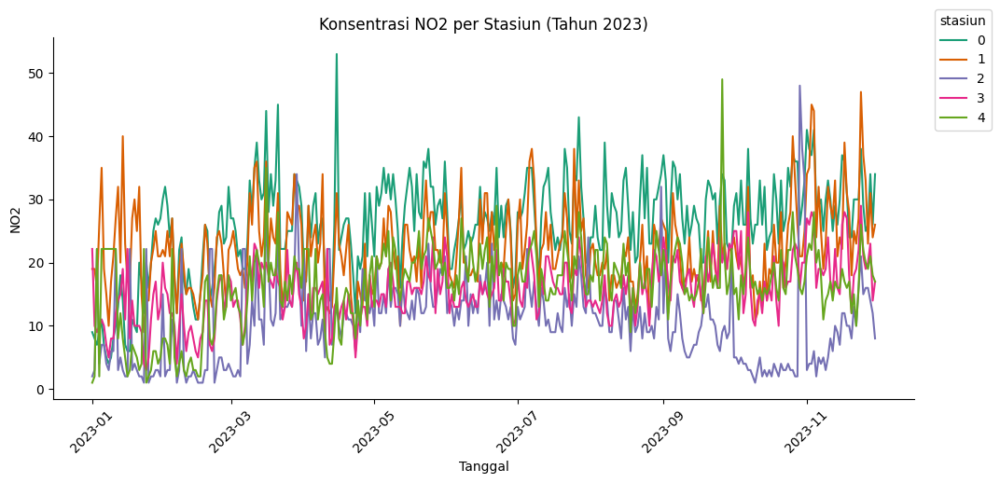

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2021
data_2023 = data[data['tanggal'].dt.year == 2023].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['no2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2023.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('NO2')
plt.title('Konsentrasi NO2 per Stasiun (Tahun 2023)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

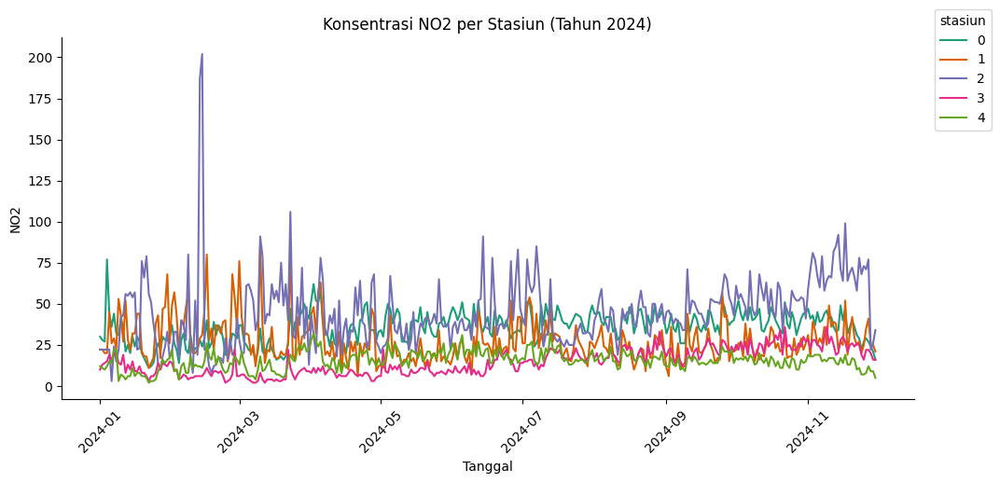

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan 'tanggal' bertipe datetime
data['tanggal'] = pd.to_datetime(data['tanggal'], errors='coerce')

# Filter data hanya untuk tahun 2024
data_2024 = data[data['tanggal'].dt.year == 2024].copy()

# Fungsi untuk plot per stasiun
def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['tanggal']
    ys = series['no2']
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# Plot
fig, ax = plt.subplots(figsize=(10, 5.2))
df_sorted = data_2024.sort_values('tanggal', ascending=True)

for i, (series_name, series) in enumerate(df_sorted.groupby('stasiun')):
    _plot_series(series, series_name, i)

fig.legend(title='stasiun', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Tanggal')
plt.ylabel('NO2')
plt.title('Konsentrasi NO2 per Stasiun (Tahun 2024)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'
# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['pm10'].quantile(0.25)
Q3 = data['pm10'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['pm10'] < lower_bound) | (data['pm10'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_pm10.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal   pm10  pm2.5   so2    co    o3   no2    max  \
1           202309 2023-09-28  163.0  287.0  29.0  17.0  29.0  19.0  287.0   
5           202310 2023-10-01  126.0  199.0  29.0  26.0  27.0  25.0  199.0   
8           202112 2021-12-07  179.0   58.0  39.0   9.0  17.0  15.0  179.0   
9           202107 2021-07-15   95.0  174.0  40.0  15.0  22.0  24.0  174.0   
11          202201 2022-01-05   95.0  165.0  53.0  18.0  55.0  32.0  165.0   
...            ...        ...    ...    ...   ...   ...   ...   ...    ...   
5546        202411 2024-11-15   18.0   65.0  55.0  30.0  35.0  28.0   65.0   
5549        202411 2024-11-18   18.0   41.0  54.0  22.0  25.0  21.0   54.0   
5550        202411 2024-11-19   19.0   51.0  54.0  27.0  23.0  25.0   54.0   
5638        202411 2024-11-17  100.0  132.0  62.0  24.0  17.0  52.0  132.0   
5807        202407 2024-07-31   96.0  113.0  52.0  28.0  28.0  20.0  113.0   

     critical  categori  stasiun  
1       

In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'

# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['pm2.5'].quantile(0.25)
Q3 = data['pm2.5'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['pm2.5'] < lower_bound) | (data['pm2.5'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_pm2.5.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal        pm10  pm2.5   so2    co    o3   no2  \
1           202309 2023-09-28  163.000000  287.0  29.0  17.0  29.0  19.0   
2           202309 2023-09-26   85.000000  249.0  28.0  18.0  26.0  20.0   
3           202309 2023-09-27   53.341196  217.0  28.0  22.0  23.0  22.0   
5           202310 2023-10-01  126.000000  199.0  29.0  26.0  27.0  25.0   
9           202107 2021-07-15   95.000000  174.0  40.0  15.0  22.0  24.0   
...            ...        ...         ...    ...   ...   ...   ...   ...   
5680        202411 2024-11-29   21.000000   10.0  67.0   6.0  13.0  26.0   
5681        202411 2024-11-30   35.000000   10.0  67.0   7.0  10.0  34.0   
5774        202407 2024-07-29   54.000000   15.0  59.0   8.0  22.0  33.0   
5775        202407 2024-07-30   55.000000   16.0  59.0   8.0  21.0  32.0   
5776        202407 2024-07-31   62.000000   16.0  28.0  26.0  21.0  28.0   

        max critical  categori  stasiun  
1     287.0        2     

In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'

# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['so2'].quantile(0.25)
Q3 = data['so2'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['so2'] < lower_bound) | (data['so2'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_so2.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal  pm10      pm2.5    so2    co   o3   no2    max  \
331         202401 2024-01-04  30.0  78.189897  112.0  20.0  8.0  77.0  112.0   
1292        202302 2023-02-04   3.0  65.000000   89.0  11.0  9.0  11.0   89.0   

     critical  categori  stasiun  
331         3         4        0  
1292        3         2        2  


In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'

# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['co'].quantile(0.25)
Q3 = data['co'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['co'] < lower_bound) | (data['co'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_co.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal       pm10       pm2.5   so2    co     o3   no2  \
10          202305 2023-05-24  53.341196  170.000000  38.0  35.0   17.0  18.0   
14          202203 2022-03-31  95.000000  160.000000  49.0  34.0  137.0  34.0   
33          202206 2022-06-16  79.000000  146.000000  46.0  32.0   50.0  45.0   
45          202310 2023-10-07  97.000000  141.000000  29.0  33.0   23.0  28.0   
97          202307 2023-07-27  53.341196  129.000000  26.0  34.0   25.0  24.0   
...            ...        ...        ...         ...   ...   ...    ...   ...   
5608        202411 2024-11-17  76.000000  115.000000  11.0  38.0   14.0  47.0   
5618        202411 2024-11-27  50.000000   78.189897  10.0  33.0   10.0  27.0   
5684        202411 2024-11-03  45.000000   52.000000  53.0  32.0   28.0  28.0   
5779        202407 2024-07-03  77.000000  105.000000  43.0  36.0   17.0  15.0   
5810        202407 2024-07-03  53.341196  121.000000  31.0  33.0   43.0  25.0   

       

In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'

# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['o3'].quantile(0.25)
Q3 = data['o3'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['o3'] < lower_bound) | (data['o3'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_o3.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal  pm10  pm2.5   so2    co     o3   no2    max  \
7           202208 2022-08-16  61.0   89.0  51.0  15.0  181.0  33.0  181.0   
12          202204 2022-04-10  82.0  164.0  46.0  27.0   80.0  38.0  164.0   
14          202203 2022-03-31  95.0  160.0  49.0  34.0  137.0  34.0  160.0   
22          202105 2021-05-07  39.0   69.0  19.0  15.0  151.0  20.0  151.0   
27          202204 2022-04-17  76.0  148.0  52.0  21.0   93.0  24.0  148.0   
...            ...        ...   ...    ...   ...   ...    ...   ...    ...   
4904        202406 2024-06-11  53.0   88.0  27.0  20.0   73.0  18.0   88.0   
4905        202406 2024-06-12  56.0   92.0  26.0  27.0   66.0  27.0   92.0   
5225        202408 2024-08-23  46.0   79.0  33.0  17.0   67.0  12.0   79.0   
5325        202409 2024-09-02  37.0   85.0  34.0  17.0   67.0  12.0   85.0   
5596        202411 2024-11-05  40.0   65.0  12.0  28.0   75.0  45.0   75.0   

     critical  categori  stasiun  
7       

In [ ]:
import pandas as pd

# Misalkan 'data' adalah DataFrame dan Anda memeriksa outlier di kolom 'pm10'

# Langkah 1: Hitung Q1 (persentil ke-25) dan Q3 (persentil ke-75)
Q1 = data['no2'].quantile(0.25)
Q3 = data['no2'].quantile(0.75)

# Langkah 2: Hitung Rentang Interkuartil (IQR)
IQR = Q3 - Q1

# Langkah 3: Tentukan batas outlier
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Langkah 4: Temukan outlier
outliers = data[(data['no2'] < lower_bound) | (data['no2'] > upper_bound)]

print("Outlier terdeteksi:")
print(outliers)

# Simpan outlier ke file CSV
outliers.to_excel("outliers_no2.xlsx", index=False)

Outlier terdeteksi:
      periode_data    tanggal  pm10  pm2.5   so2    co    o3    no2    max  \
4           202402 2024-02-14  43.0   55.0  51.0  10.0  20.0  202.0  202.0   
6           202402 2024-02-13  57.0   72.0  52.0  14.0  18.0  187.0  187.0   
60          202206 2022-06-04  78.0  136.0  44.0  26.0  92.0   51.0  136.0   
92          202106 2021-06-25  76.0  129.0  35.0  30.0  14.0   63.0  129.0   
95          202201 2022-01-30  75.0  129.0  53.0  25.0  59.0   50.0  129.0   
...            ...        ...   ...    ...   ...   ...   ...    ...    ...   
5750        202407 2024-07-05  52.0   69.0  58.0  12.0   9.0   57.0   69.0   
5751        202407 2024-07-06  28.0   50.0  57.0   8.0   6.0   61.0   61.0   
5752        202407 2024-07-07  22.0   32.0  57.0  11.0   8.0   85.0   85.0   
5753        202407 2024-07-08  36.0   60.0  58.0  11.0  11.0   66.0   66.0   
5758        202407 2024-07-13  68.0  111.0  59.0  19.0  17.0   65.0  111.0   

     critical  categori  stasiun  
4       

# Data Test 10%

In [ ]:
import time
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
# 2. Memilih fitur dan target
features = ['pm10', 'so2', 'co', 'o3', 'no2']
target = 'pm2.5'
X = data[features]
y = data[target]

# 3. Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
X_train.to_csv('X_train90.csv', index=False)
X_test.to_csv('X_test10.csv', index=False)
y_train.to_csv('y_train90.csv', index=False)
y_test.to_csv('y_test10.csv', index=False)

### XGBOOST

=== Parameter XGBoost yang Digunakan ===
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Processing Time: 1.131915807723999 seconds
      Actual PM

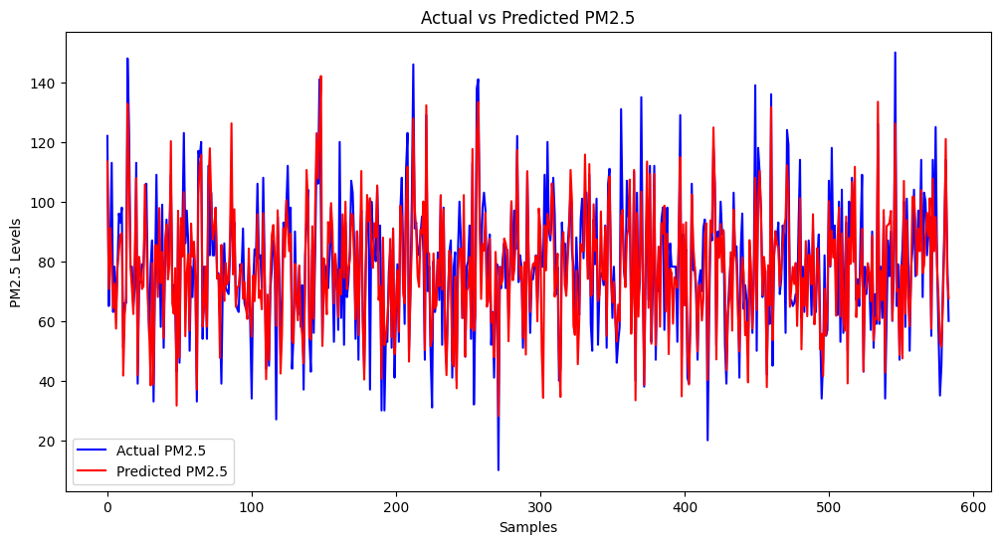


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      105.874809
1 2024-08-02       95.334953
2 2024-08-03       90.492950


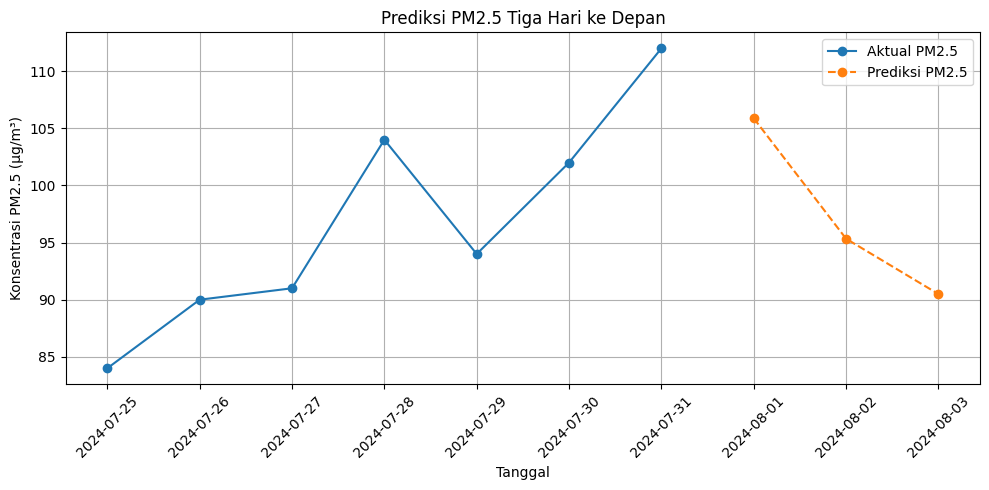

SHAP values shape: (584, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.667860
so2      3.871776
o3       2.525059
co       2.378914
no2      1.569388
dtype: float32


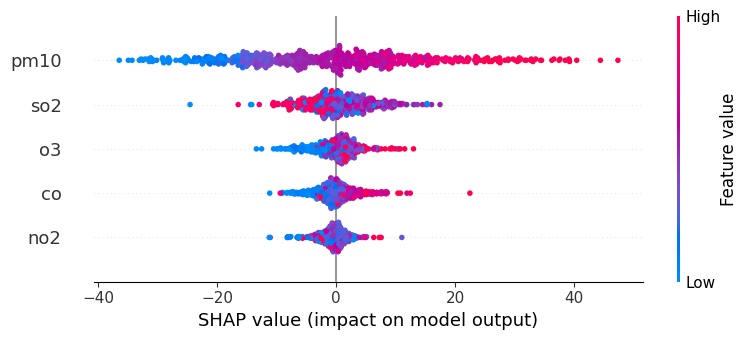

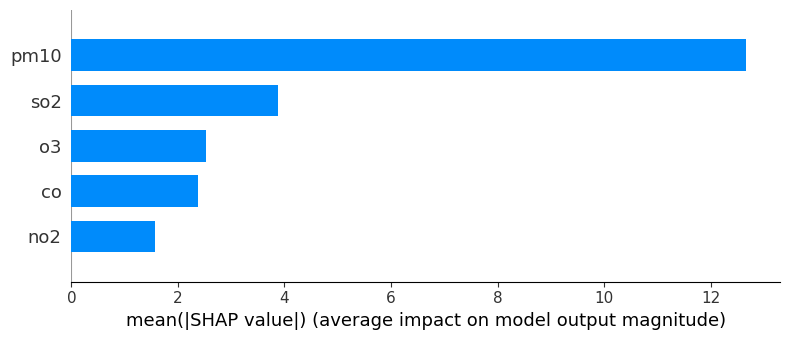

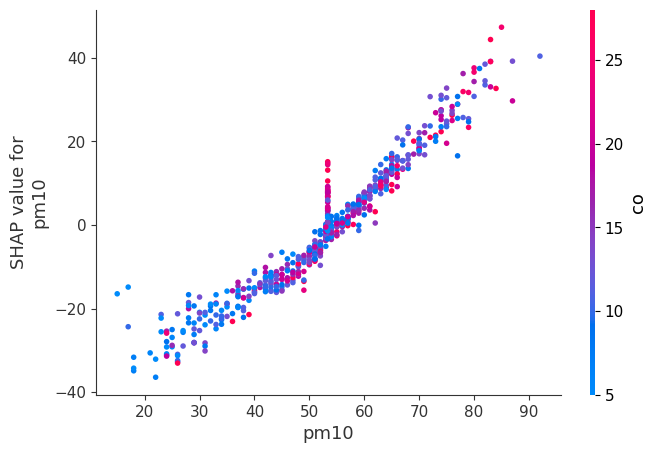

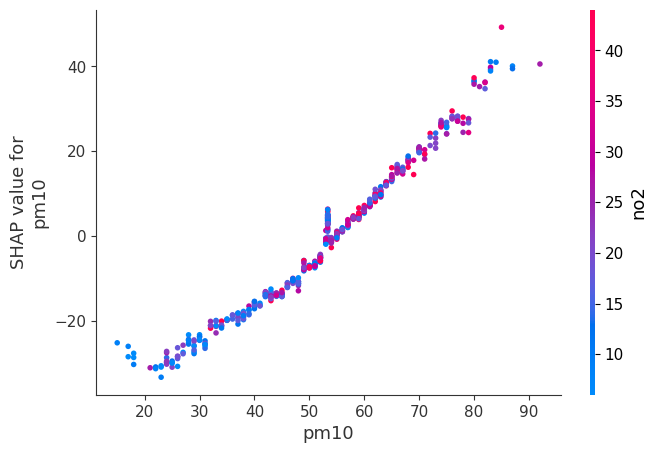

In [ ]:
# Model XGBoost Tanpa Grid Search

# 5. Inisialisasi model XGBoost dengan parameter default
model = XGBRegressor()
print("=== Parameter XGBoost yang Digunakan ===")
print(model.get_params())

start_time_xgb = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_xgb = time.time() - start_time_xgb
print(f'Processing Time: {time_xgb} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung RMSE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.1, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# 8. Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)

print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### Random Forest

=== Parameter Random Forest yang Digunakan ===
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Processing Time: 2.43 seconds
      Actual PM2.5  Predicted PM2.5  Difference
158          122.0       113.400000   -8.600000
3133          65.0        74.477596    9.477596
1486          86.0        90.991899    4.991899
299          113.0        77.572160  -35.427840
3307          63.0        69.520000    6.520000
...            ...              ...         ...
2749          71.0        61.871899   -9.128101
5804          90.0        89.430000   -0.570000
281          114.0       112.440000   -1.560000
1790          82.0        75.900000   -6.10

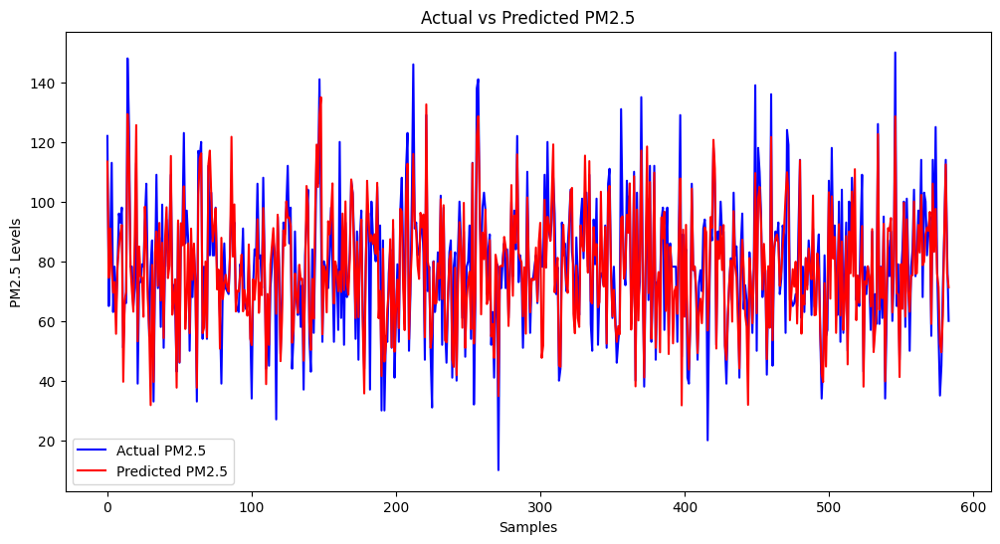


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      105.874809
1 2024-08-02       95.334953
2 2024-08-03       90.492950


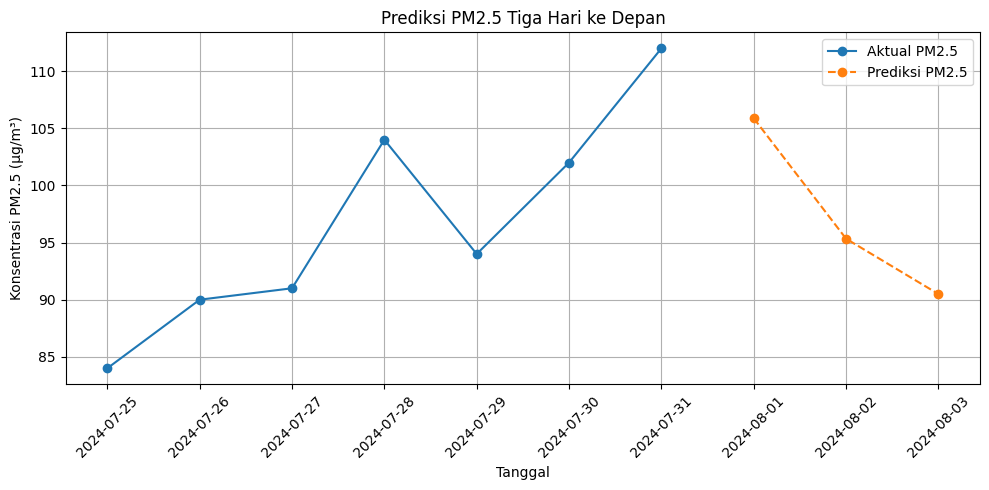

SHAP values shape: (584, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.800510
so2      3.509400
o3       2.294804
co       1.939857
no2      1.189539
dtype: float64


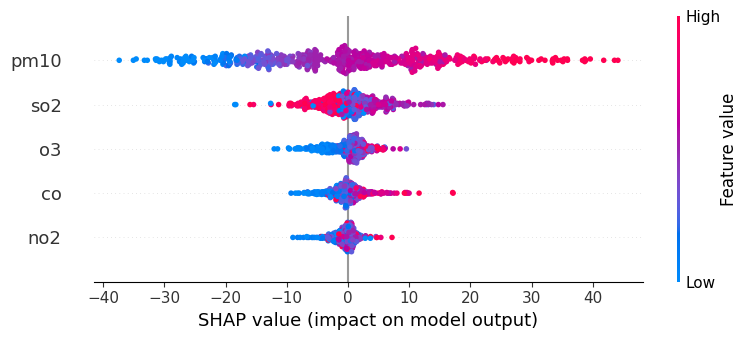

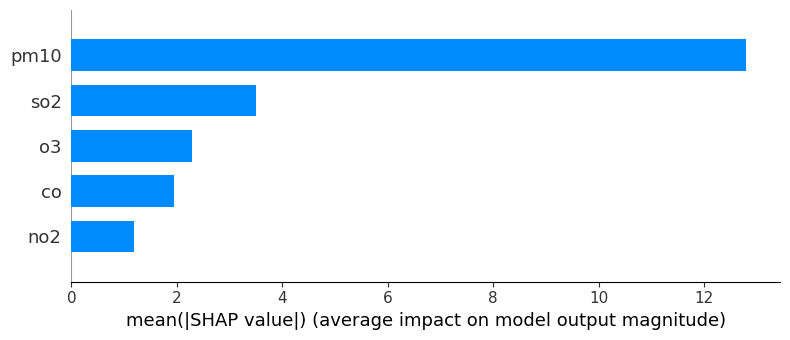

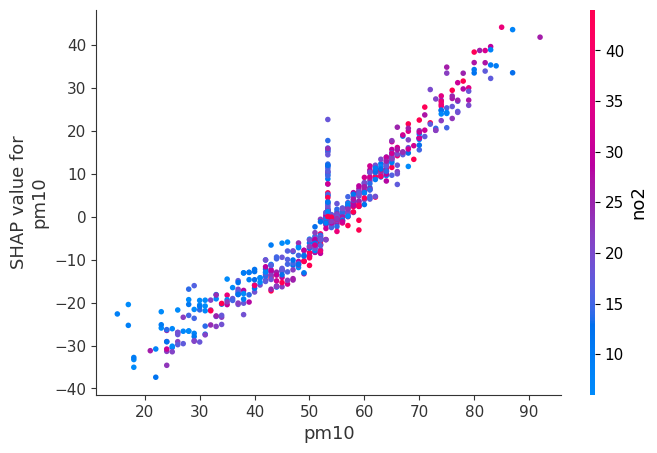

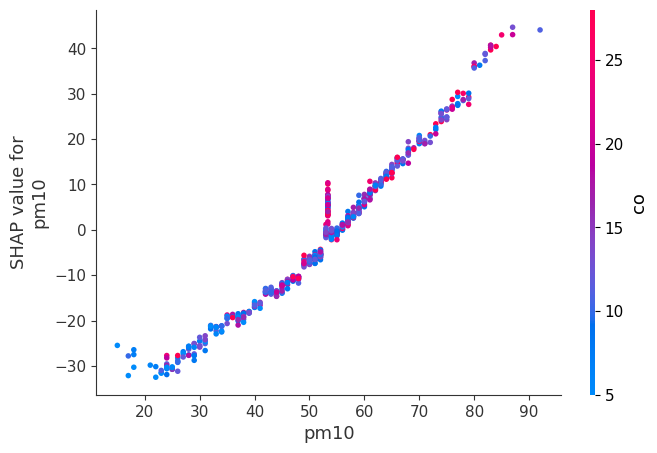

In [ ]:
# Model Random Forest Default

# 5. Inisialisasi model Random Forest dengan parameter default
model = RandomForestRegressor()
print("=== Parameter Random Forest yang Digunakan ===")
print(model.get_params())

start_time_rf = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_rf = time.time() - start_time_rf
print(f'Processing Time: {time_rf:.2f} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.1, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### XGB GS

Best Parameters:  {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}
XGBoost - Processing Time: 35.489290952682495 seconds
      Actual PM2.5  Predicted PM2.5  Difference
158          122.0       112.946640   -9.053360
3133          65.0        73.419991    8.419991
1486          86.0        94.006508    8.006508
299          113.0        76.030121  -36.969879
3307          63.0        65.515282    2.515282
...            ...              ...         ...
2749          71.0        61.372547   -9.627453
5804          90.0        89.771835   -0.228165
281          114.0       117.623451    3.623451
1790          82.0        76.234520   -5.765480
3484          60.0        68.900841    8.900841

[584 rows x 3 columns]
RMSE: 11.55
R-squared: 0.72


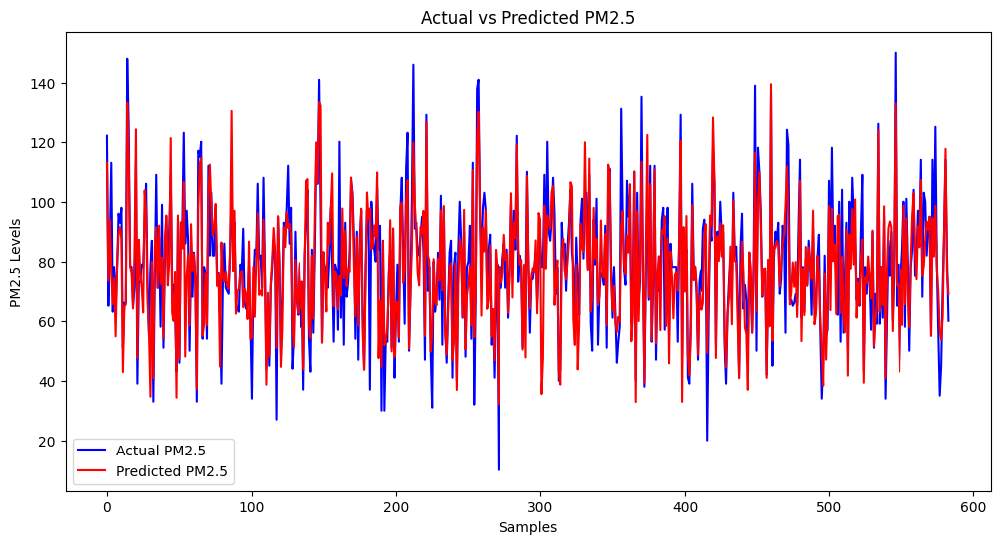


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      105.874809
1 2024-08-02       95.334953
2 2024-08-03       90.492950


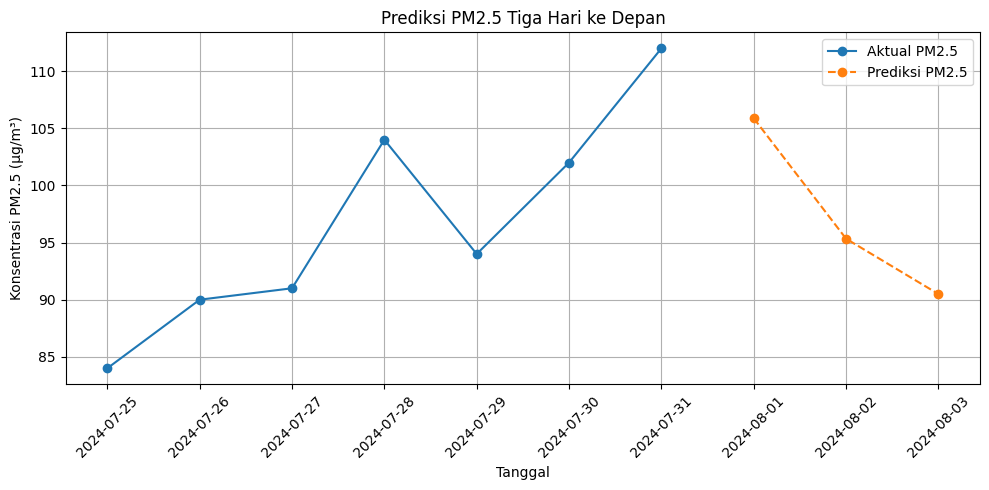

SHAP values shape: (584, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.712387
so2      3.710958
o3       2.614696
co       2.183464
no2      1.528112
dtype: float32


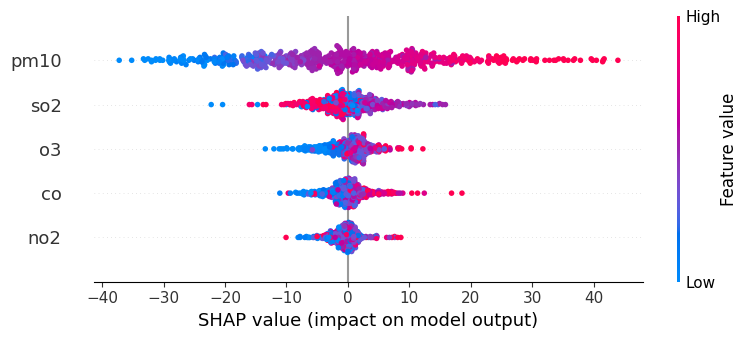

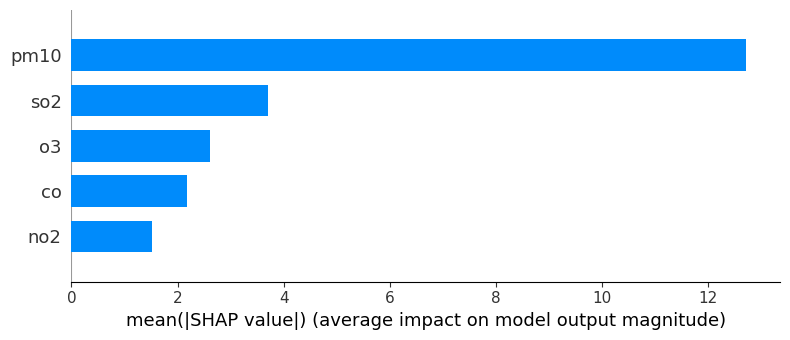

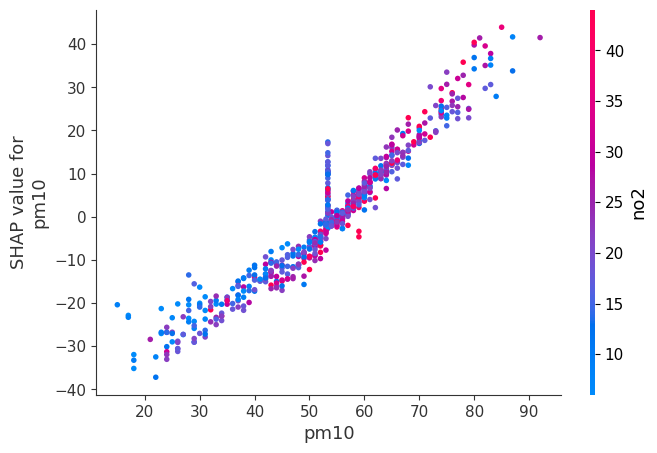

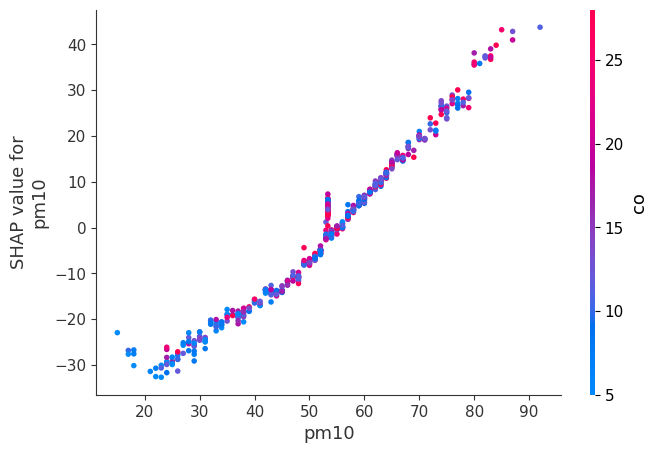

In [ ]:
# Model XGBoost With GS

# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100,300],
    'max_depth': [5,7,9],
    'learning_rate': [0.1, 0.15],
}

start_time_xgb = time.time()

# 7. Inisialisasi model XGBoost
model = XGBRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv= 10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model XGBoost dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_xgb = time.time()  # Akhiri waktu untuk XGBoost
time_xgb = end_time_xgb - start_time_xgb
print(f'XGBoost - Processing Time: {time_xgb} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.1, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### RF GS

Best Parameters:  {'max_depth': 9, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Random Forest - Processing Time: 305.5207459926605 seconds
      Actual PM2.5  Predicted PM2.5  Difference
158          122.0       110.506627  -11.493373
3133          65.0        73.550375    8.550375
1486          86.0        92.691196    6.691196
299          113.0        75.551082  -37.448918
3307          63.0        72.826958    9.826958
...            ...              ...         ...
2749          71.0        64.565407   -6.434593
5804          90.0        89.146844   -0.853156
281          114.0       117.449205    3.449205
1790          82.0        76.940453   -5.059547
3484          60.0        72.109483   12.109483

[584 rows x 3 columns]
RMSE: 11.52
R-squared: 0.73


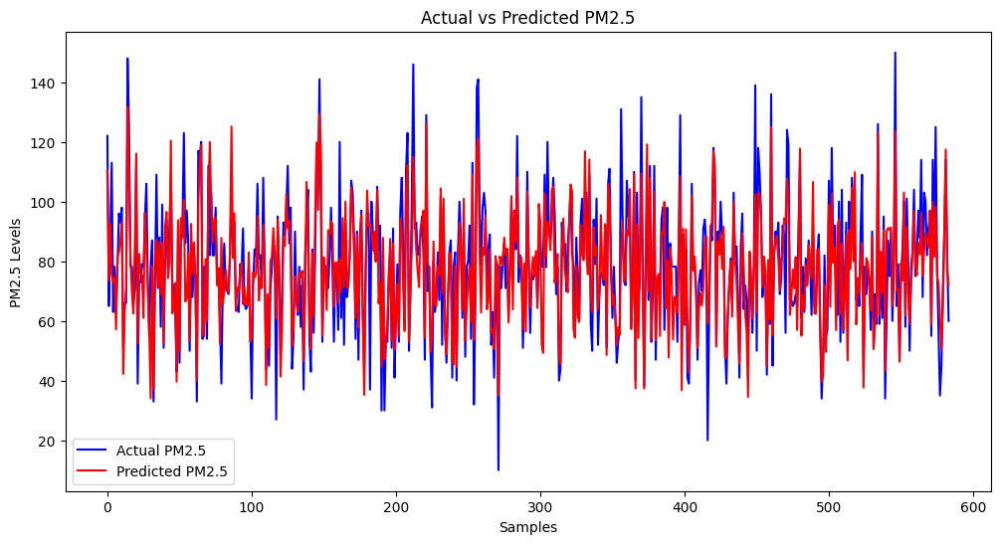


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      105.874809
1 2024-08-02       95.334953
2 2024-08-03       90.492950


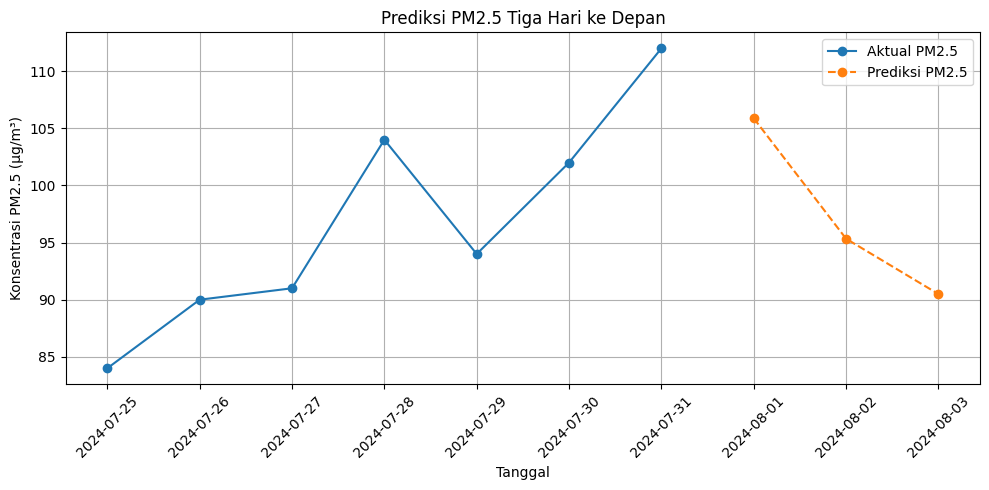

SHAP values shape: (584, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.622643
so2      3.279796
o3       2.146012
co       1.677016
no2      0.893467
dtype: float64


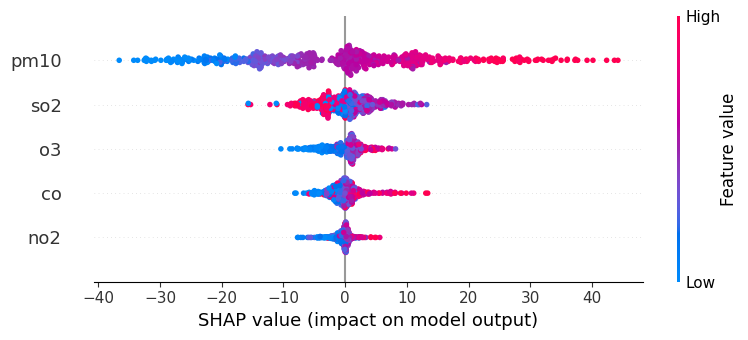

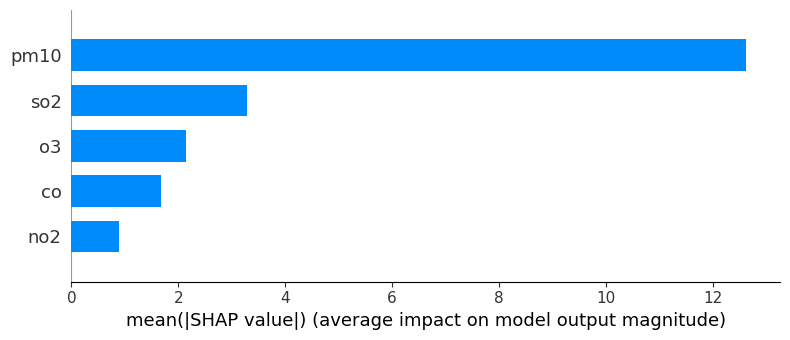

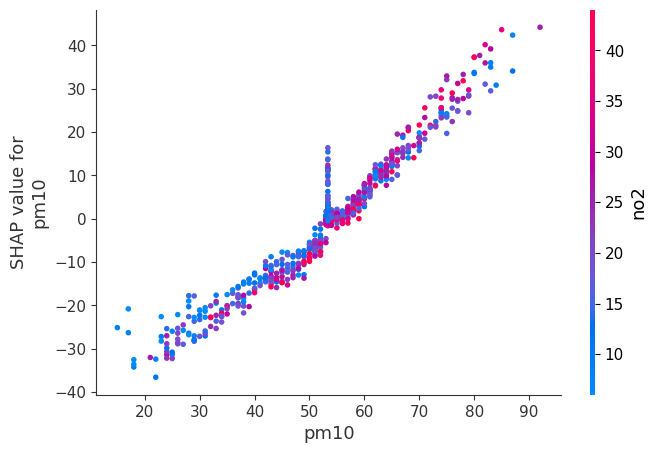

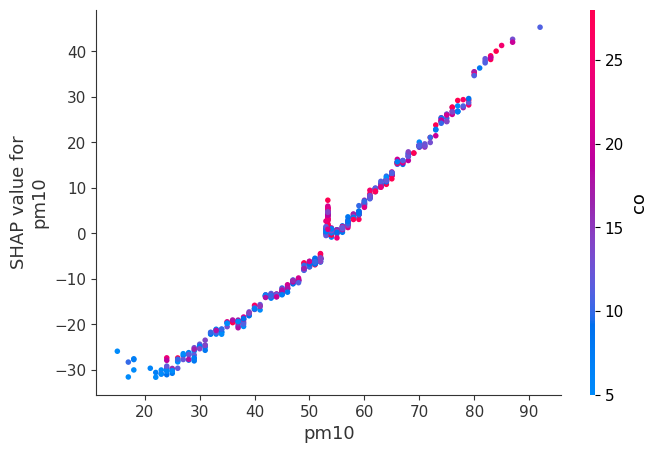

In [ ]:
#Model RF + GS

# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5,7,9],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

start_time_rf = time.time()

# 7. Inisialisasi model Random Forest
model = RandomForestRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model Random Forest dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_rf = time.time()  # Akhiri waktu untuk Random Forest
time_rf = end_time_rf - start_time_rf
print(f'Random Forest - Processing Time: {time_rf} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.1, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

# Data Test 20%

In [ ]:
import time
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
# 2. Memilih fitur dan target
features = ['pm10', 'so2', 'co', 'o3', 'no2']
target = 'pm2.5'
X = data[features]
y = data[target]

# 3. Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train.to_csv('X_train80.csv', index=False)
X_test.to_csv('X_test20.csv', index=False)
y_train.to_csv('y_train80.csv', index=False)
y_test.to_csv('y_test20.csv', index=False)

### XGB

=== Parameter XGBoost yang Digunakan ===
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Processing Time: 0.09116554260253906 seconds
      Actual 

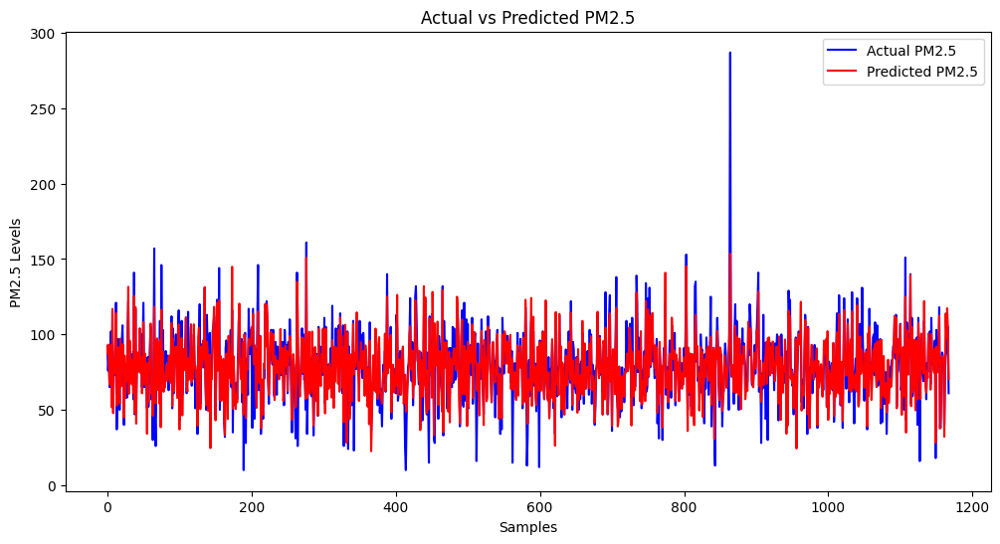


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01       98.148117
1 2024-08-02      110.351463
2 2024-08-03      112.402130


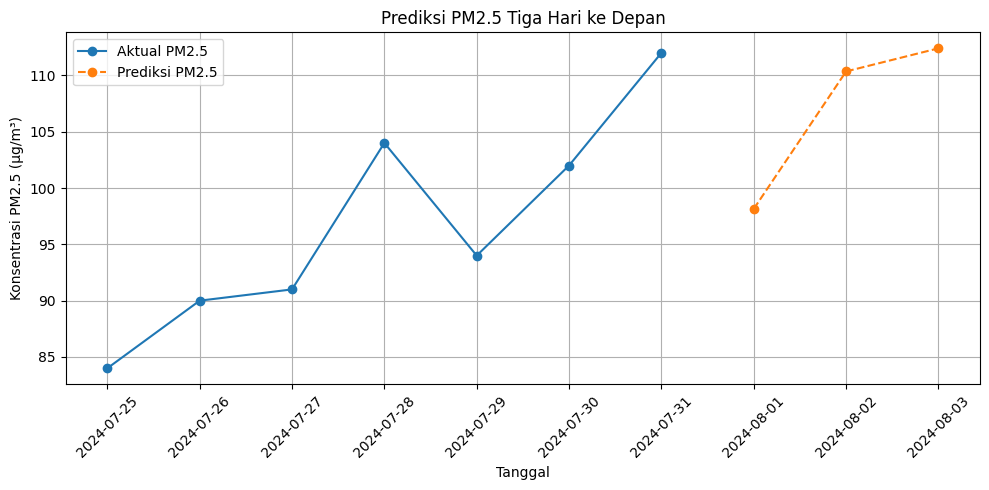

SHAP values shape: (1168, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    13.321321
so2      3.718813
o3       2.505714
co       2.092087
no2      1.678263
dtype: float32


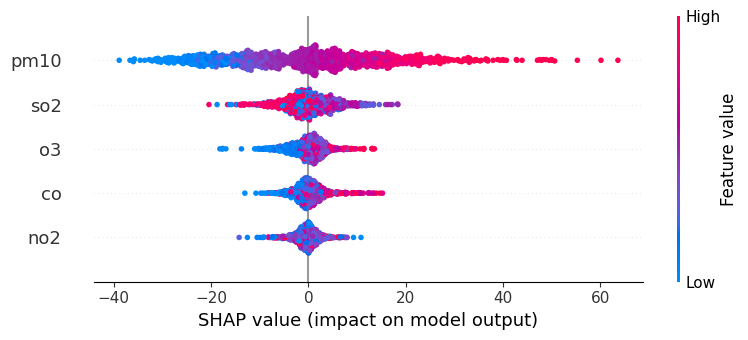

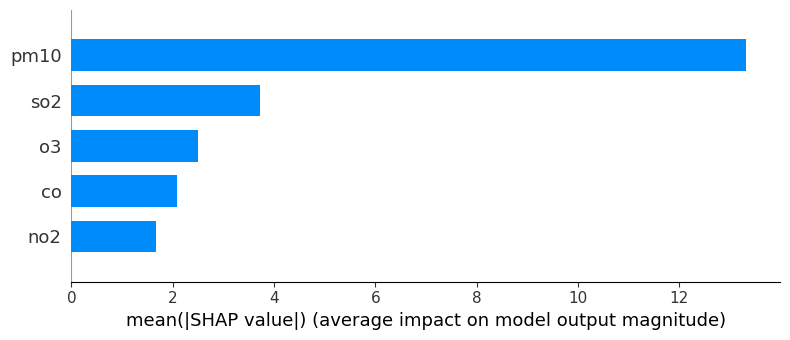

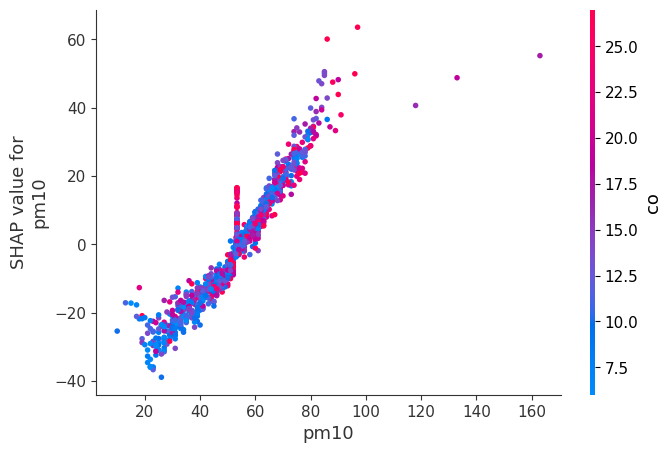

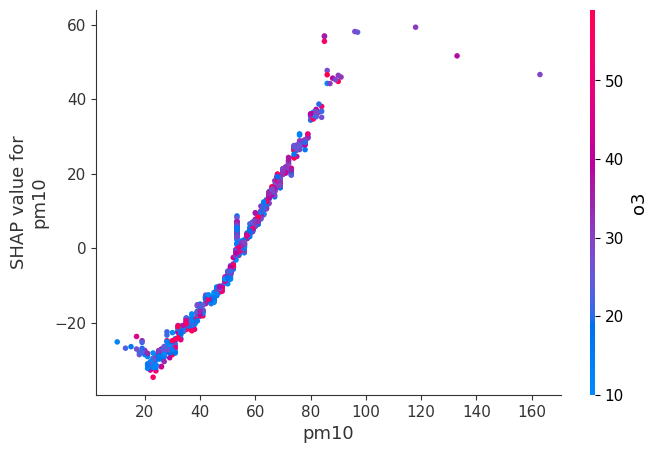

In [ ]:
# Model XGBoost Tanpa Grid Search

# 5. Inisialisasi model XGBoost dengan parameter default
model = XGBRegressor()
print("=== Parameter XGBoost yang Digunakan ===")
print(model.get_params())

start_time_xgb = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_xgb = time.time() - start_time_xgb
print(f'Processing Time: {time_xgb} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.2, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### RF

=== Parameter Random Forest yang Digunakan ===
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Processing Time: 1.4115653038024902 seconds
      Actual PM2.5  Predicted PM2.5  Difference
5716          92.0        87.310000   -4.690000
2329          76.0        88.140000   12.140000
1643          84.0        82.790000   -1.210000
3172          65.0        65.831899    0.831899
3102          66.0        69.831272    3.831272
...            ...              ...         ...
1511          86.0       112.650000   26.650000
1283          89.0        86.227718   -2.772282
504          106.0       109.680000    3.680000
4915         105.0       105.

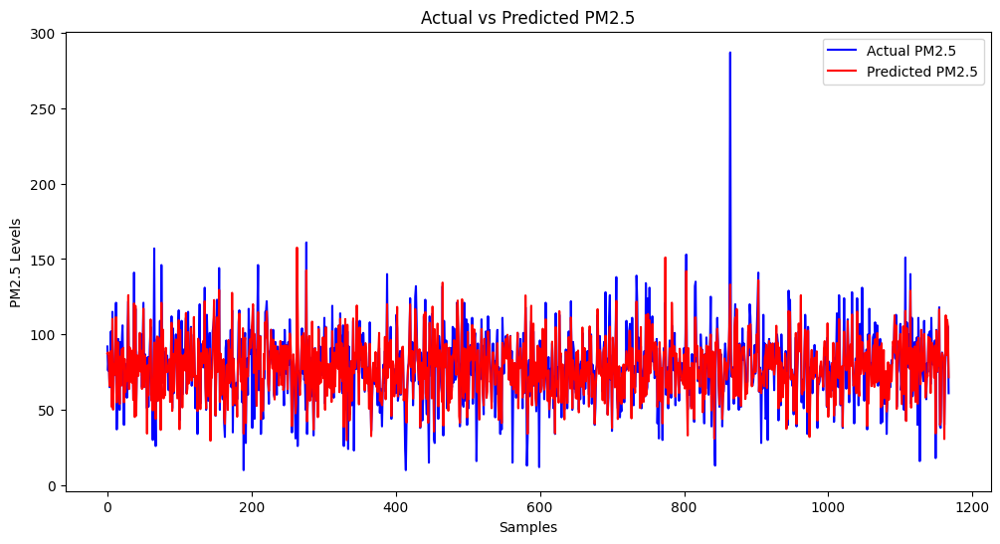


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01       98.148117
1 2024-08-02      110.351463
2 2024-08-03      112.402130


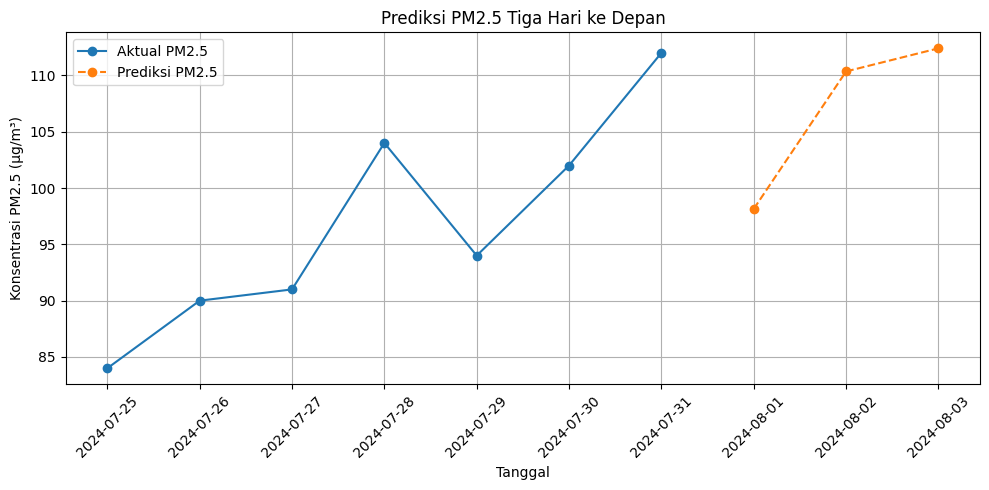

SHAP values shape: (1168, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    13.267922
so2      3.424140
o3       2.085547
co       1.841355
no2      1.132386
dtype: float64


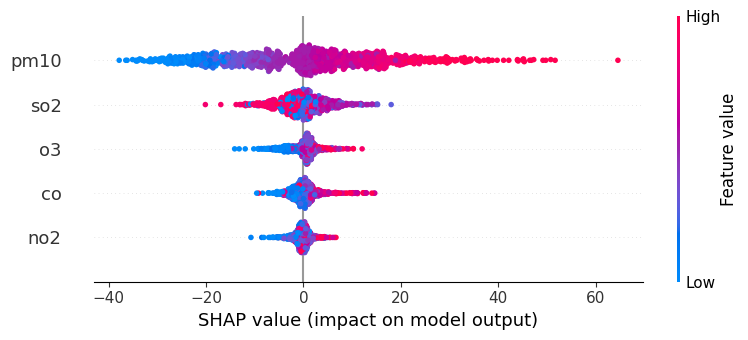

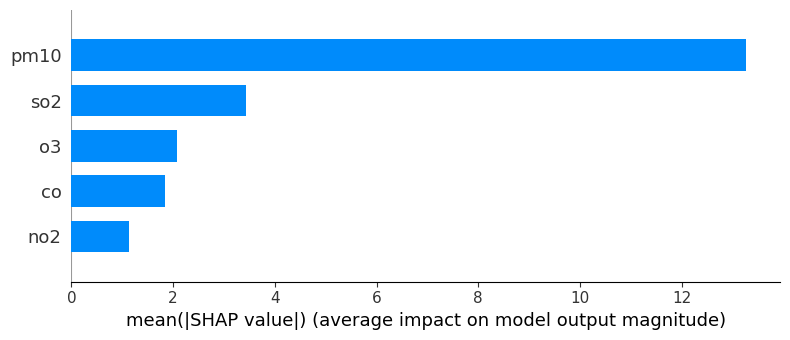

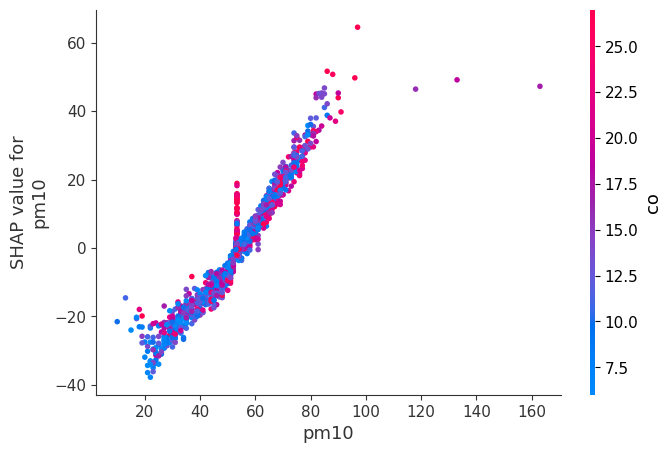

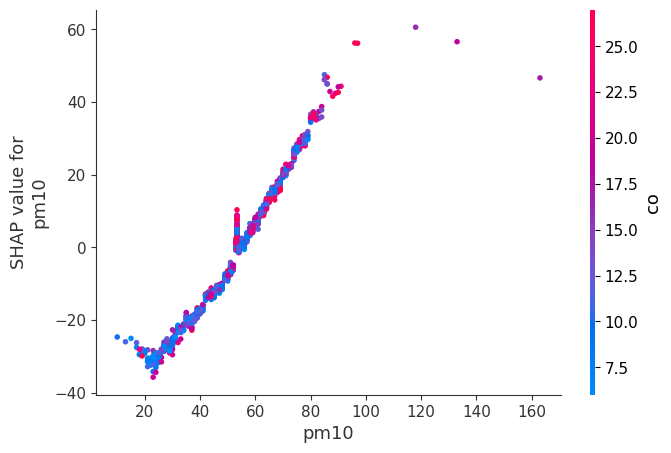

In [ ]:
# Model Random Forest Default

# 5. Inisialisasi model Random Forest dengan parameter default
model = RandomForestRegressor()
# Parameter
print("=== Parameter Random Forest yang Digunakan ===")
print(model.get_params())

start_time_rf = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_rf = time.time() - start_time_rf
print(f'Processing Time: {time_rf} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.2, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### XGB GS

Best Parameters:  {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
XGBoost - Processing Time: 35.07072162628174 seconds
      Actual PM2.5  Predicted PM2.5  Difference
5716          92.0        84.724312   -7.275688
2329          76.0        91.208710   15.208710
1643          84.0        81.210258   -2.789742
3172          65.0        66.915726    1.915726
3102          66.0        74.051323    8.051323
...            ...              ...         ...
1511          86.0       108.929878   22.929878
1283          89.0        90.167198    1.167198
504          106.0       117.583755   11.583755
4915         105.0       104.536720   -0.463280
3462          61.0        74.527008   13.527008

[1168 rows x 3 columns]
RMSE: 12.80
R-squared: 0.70


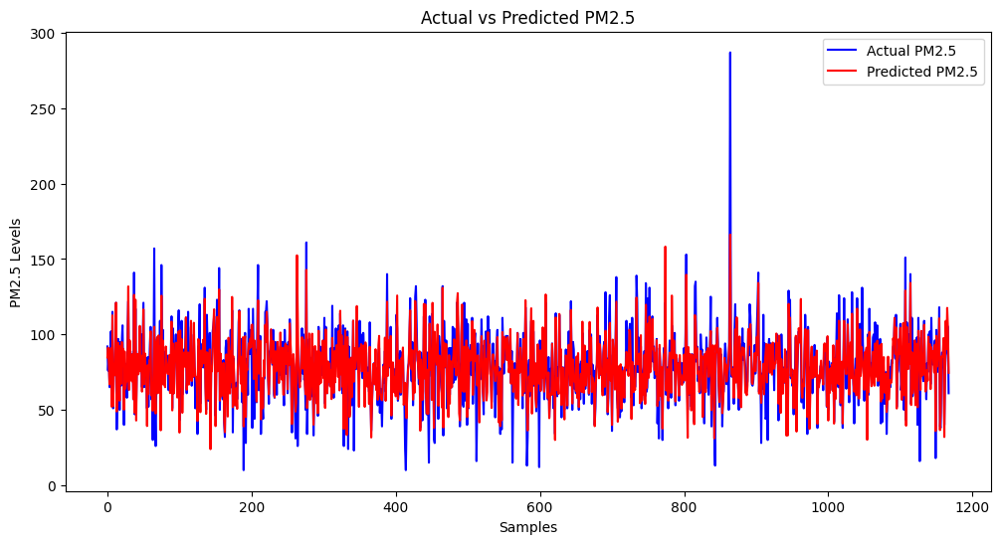


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01       98.148117
1 2024-08-02      110.351463
2 2024-08-03      112.402130


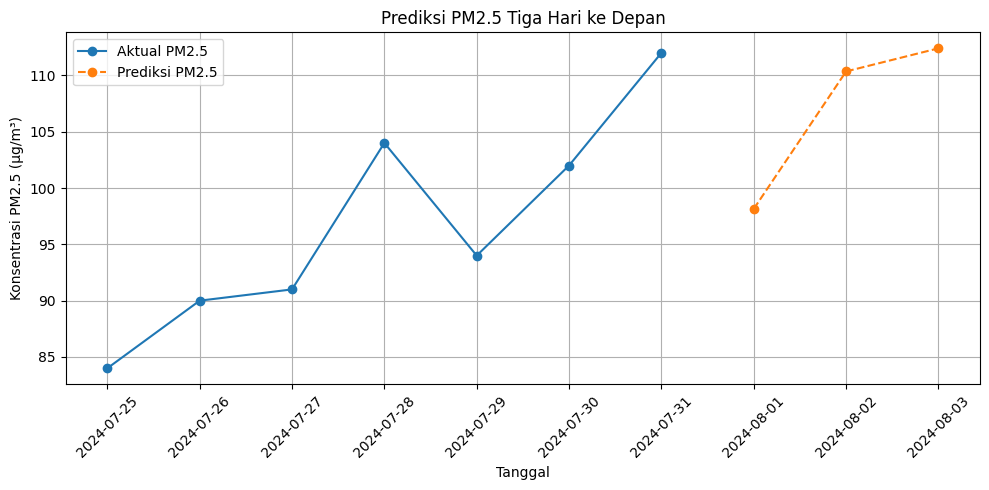

SHAP values shape: (1168, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    13.348945
so2      3.508005
o3       2.231481
co       1.834047
no2      1.292870
dtype: float32


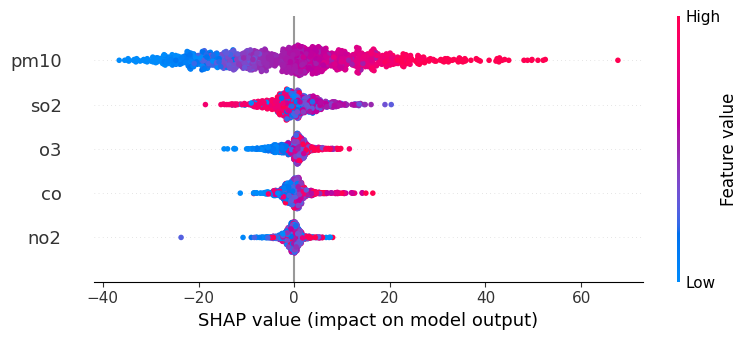

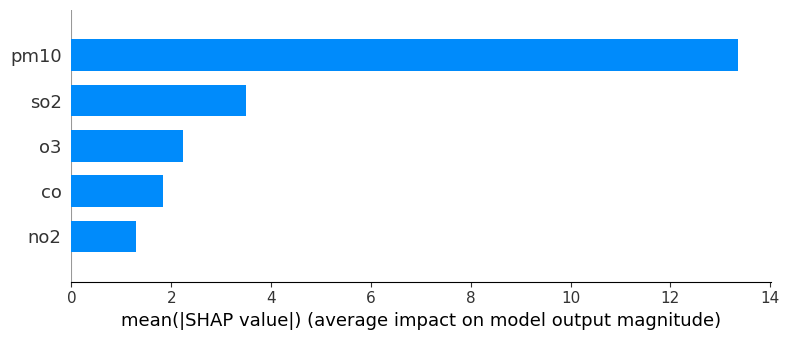

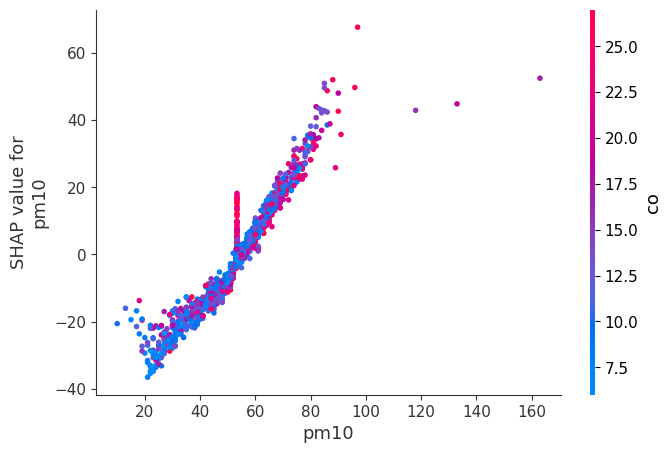

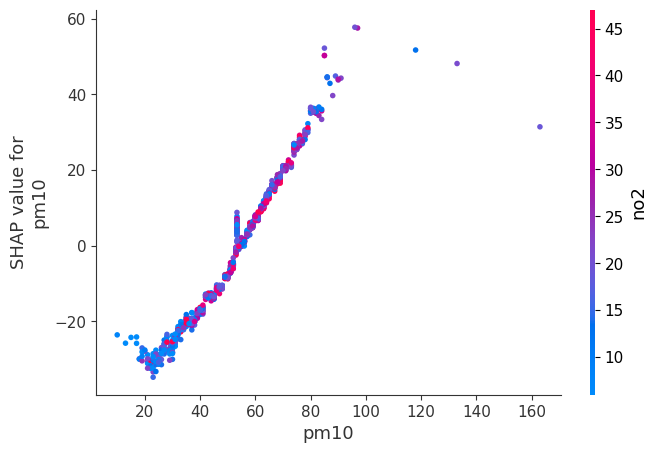

In [ ]:
# Model XGBoost With GS

# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5,7,9],
    'learning_rate': [0.1, 0.15],
}

start_time_xgb = time.time()

# 7. Inisialisasi model XGBoost
model = XGBRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv= 10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model XGBoost dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_xgb = time.time()  # Akhiri waktu untuk XGBoost
time_xgb = end_time_xgb - start_time_xgb

print(f'XGBoost - Processing Time: {time_xgb} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.2, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)


# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### RF GS

Best Parameters:  {'max_depth': 9, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
Random Forest - Processing Time: 281.77734422683716 seconds
      Actual PM2.5  Predicted PM2.5  Difference
5716          92.0        83.420090   -8.579910
2329          76.0        85.959521    9.959521
1643          84.0        82.078366   -1.921634
3172          65.0        68.268236    3.268236
3102          66.0        70.020005    4.020005
...            ...              ...         ...
1511          86.0       110.186595   24.186595
1283          89.0        83.585195   -5.414805
504          106.0       108.051206    2.051206
4915         105.0       102.561789   -2.438211
3462          61.0        80.281426   19.281426

[1168 rows x 3 columns]
RMSE: 13.06
R-squared: 0.69


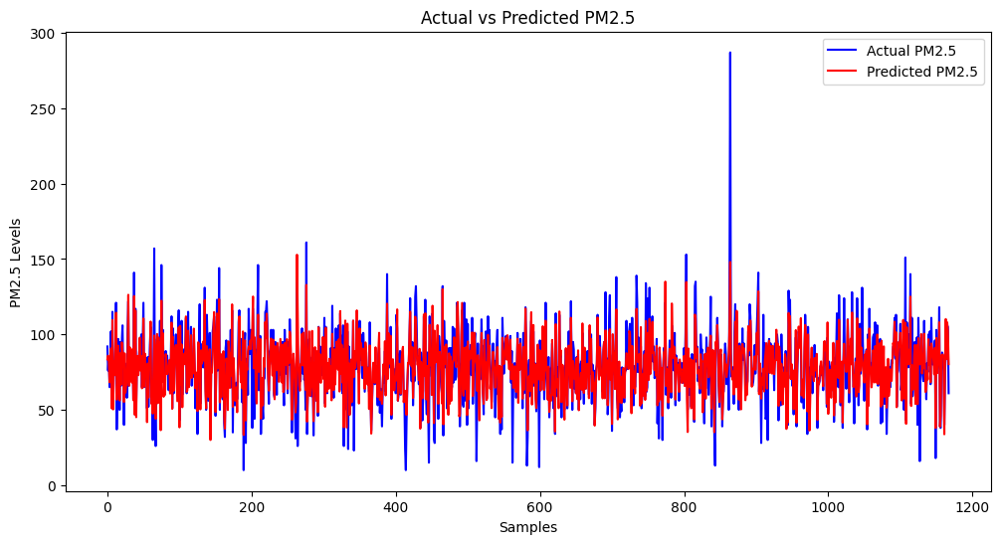


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01       98.148117
1 2024-08-02      110.351463
2 2024-08-03      112.402130


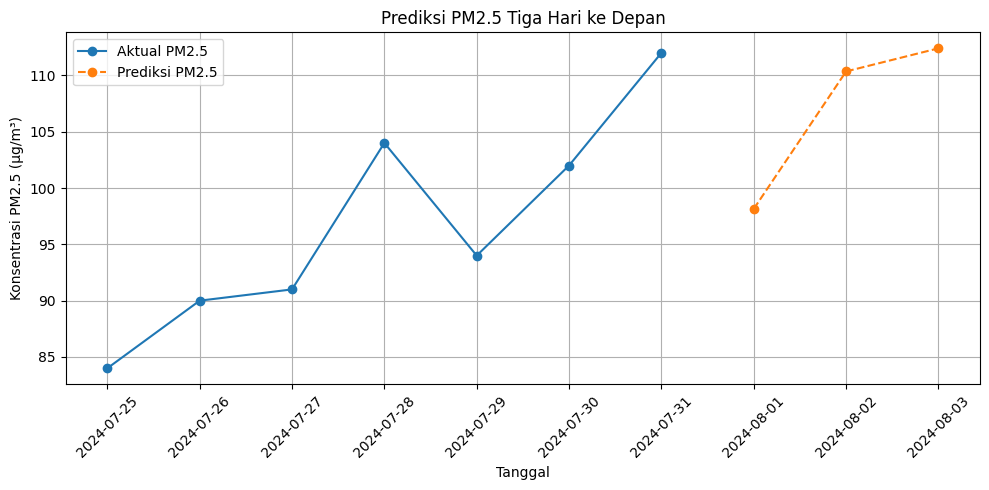

SHAP values shape: (1168, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    13.180580
so2      3.214799
o3       1.980152
co       1.608092
no2      0.869619
dtype: float64


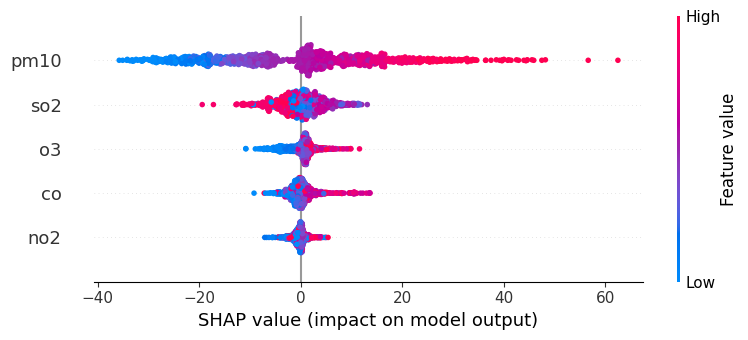

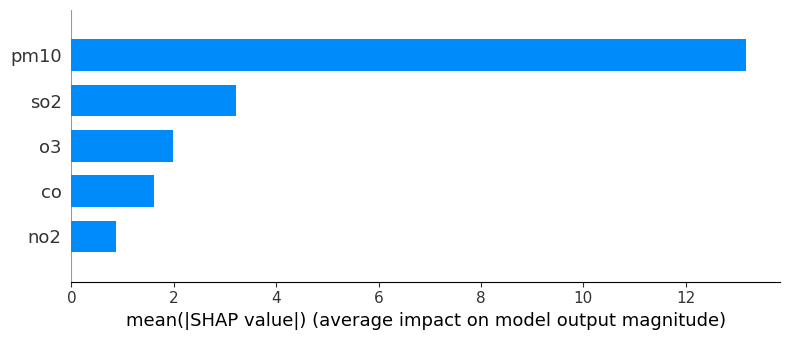

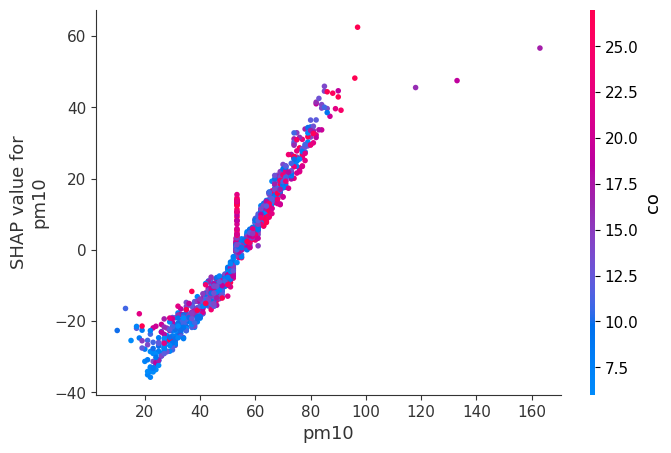

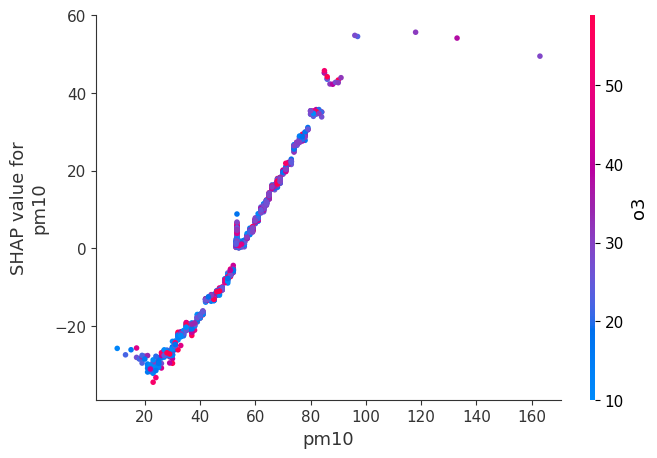

In [ ]:
#Model RF + GS
# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5,7,9],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

start_time_rf = time.time()

# 7. Inisialisasi model Random Forest
model = RandomForestRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model Random Forest dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_rf = time.time()  # Akhiri waktu untuk Random Forest
time_rf = end_time_rf - start_time_rf

print(f'Random Forest - Processing Time: {time_rf} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.2, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

# Data Test 30%

In [ ]:
import time
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
# 2. Memilih fitur dan target
features = ['pm10', 'so2', 'co', 'o3', 'no2']
target = 'pm2.5'
X = data[features]
y = data[target]

# 3. Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
X_train.to_csv('X_train70.csv', index=False)
X_test.to_csv('X_test30.csv', index=False)
y_train.to_csv('y_train70.csv', index=False)
y_test.to_csv('y_test30.csv', index=False)

### XGB

=== Parameter XGBoost yang Digunakan ===
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Processing Time: 1.9617481231689453 seconds
      Actual P

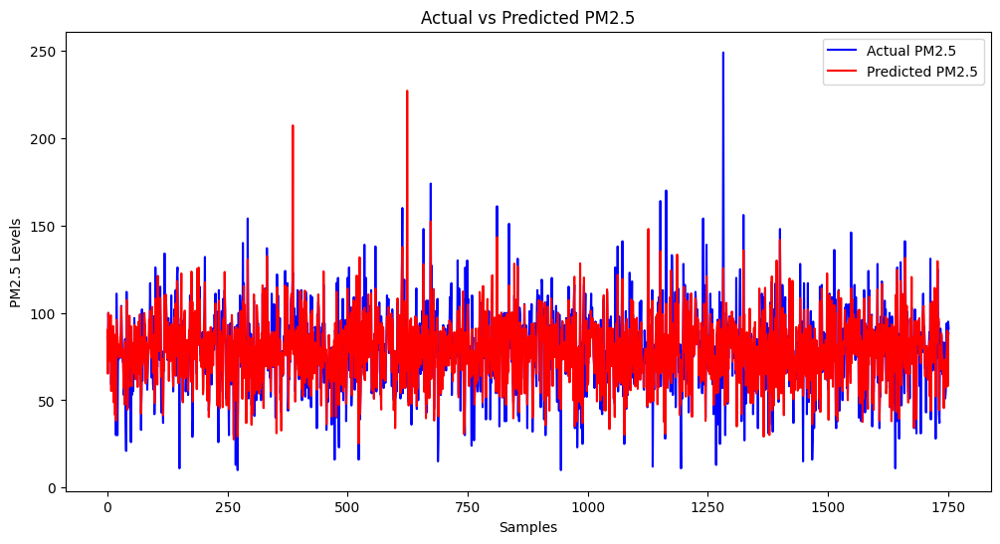


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      103.852966
1 2024-08-02      109.915192
2 2024-08-03      110.112274


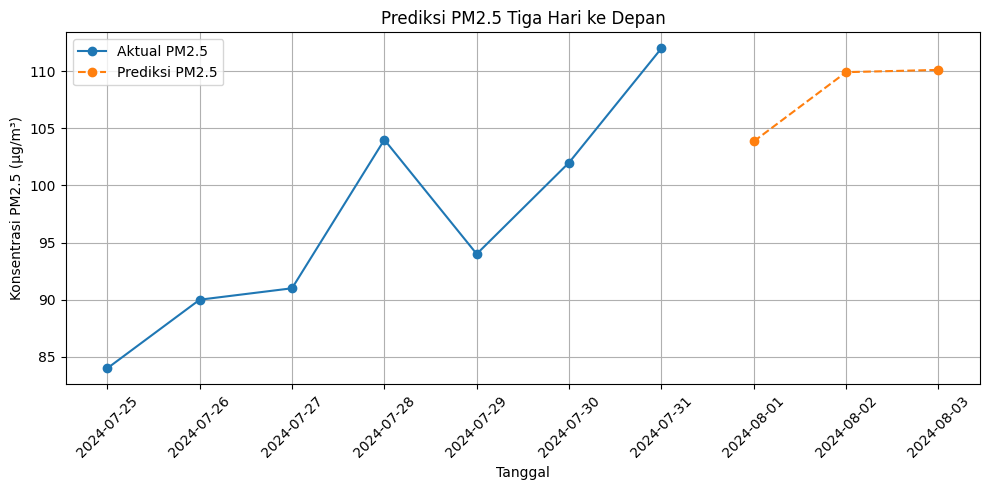

SHAP values shape: (1752, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.738762
so2      3.727583
o3       2.495074
co       2.202121
no2      1.564479
dtype: float32


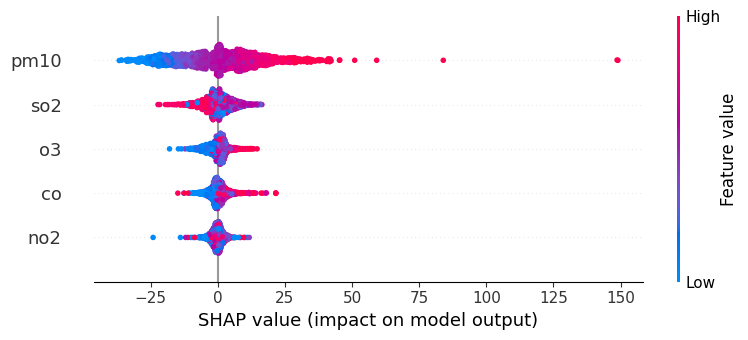

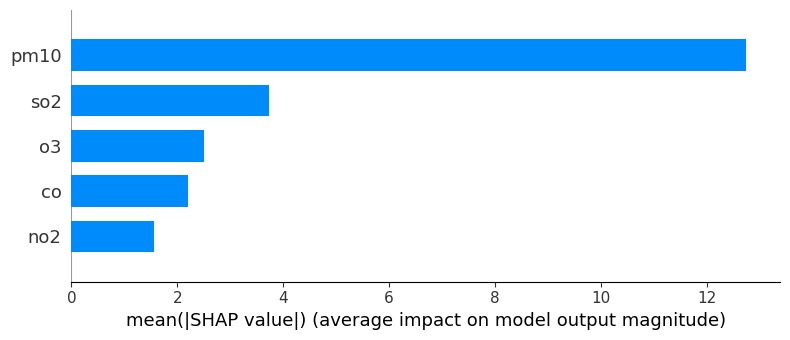

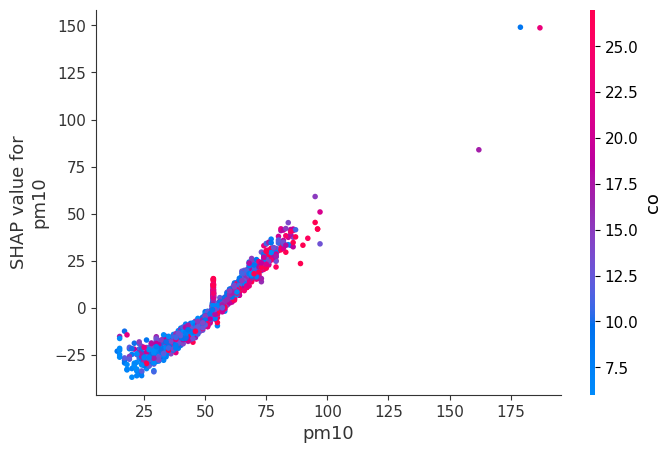

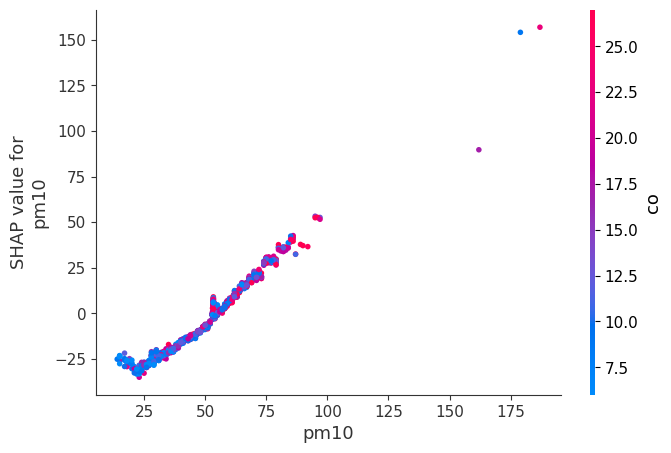

In [ ]:
# Model XGBoost Tanpa Grid Search

# 5. Inisialisasi model XGBoost dengan parameter default
model = XGBRegressor()
# Parameter
print("=== Parameter XGBoost yang Digunakan ===")
print(model.get_params())

start_time_xgb = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_xgb = time.time() - start_time_xgb
print(f'Processing Time: {time_xgb} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.3, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### RF

=== Parameter Random Forest yang Digunakan ===
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Processing Time: 1.3472490310668945 seconds
      Actual PM2.5  Predicted PM2.5  Difference
1486     86.000000         87.48000    1.480000
2497     74.000000         73.70000   -0.300000
679     100.000000         98.07000   -1.930000
1710     83.000000         91.35000    8.350000
1974     80.000000         81.28000    1.280000
...            ...              ...         ...
980      94.000000         80.28000  -13.720000
3656     78.189897         85.55507    7.365173
2546     73.000000         54.62000  -18.380000
899      95.000000         86

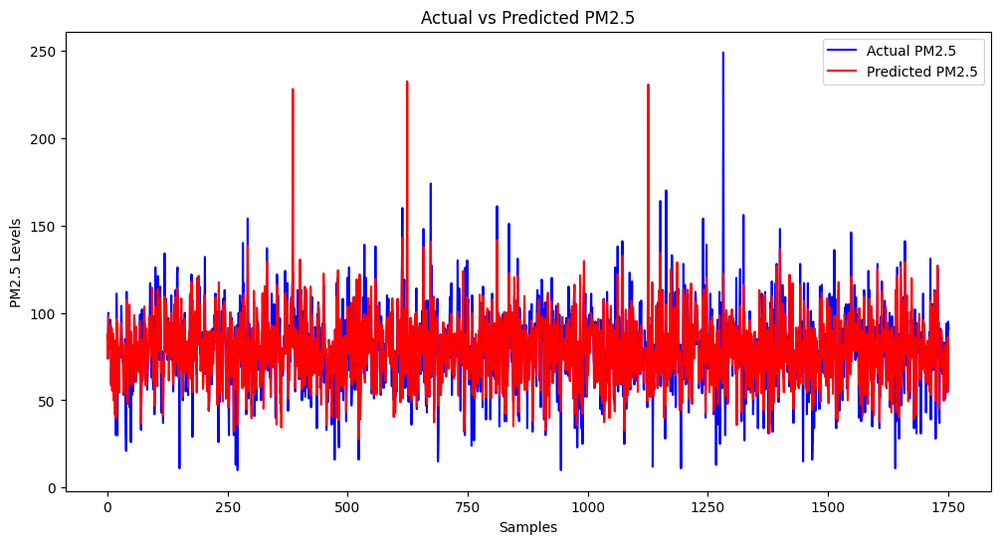


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      103.852966
1 2024-08-02      109.915192
2 2024-08-03      110.112274


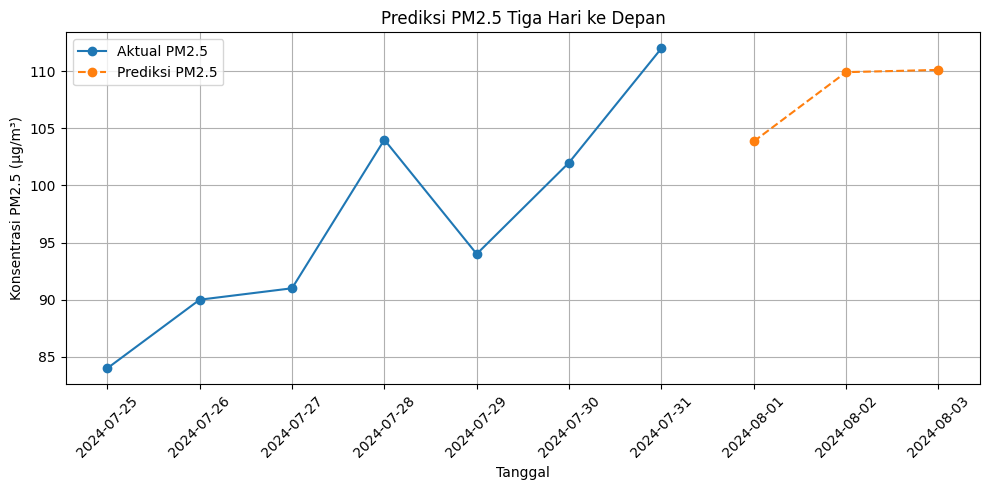

SHAP values shape: (1752, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.716420
so2      3.230561
o3       2.136758
co       1.891733
no2      1.079888
dtype: float64


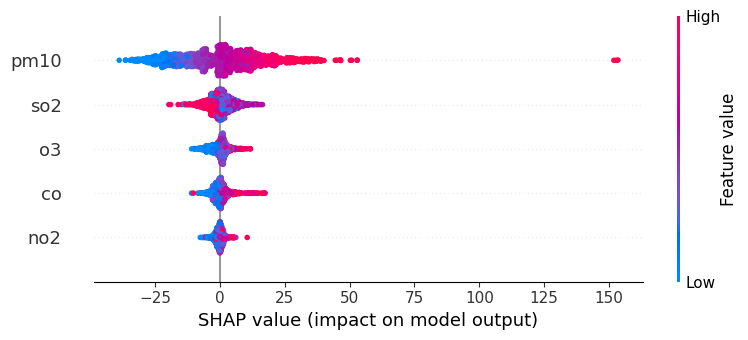

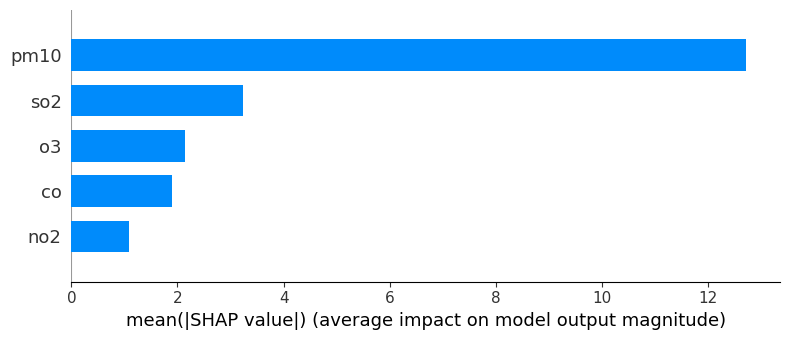

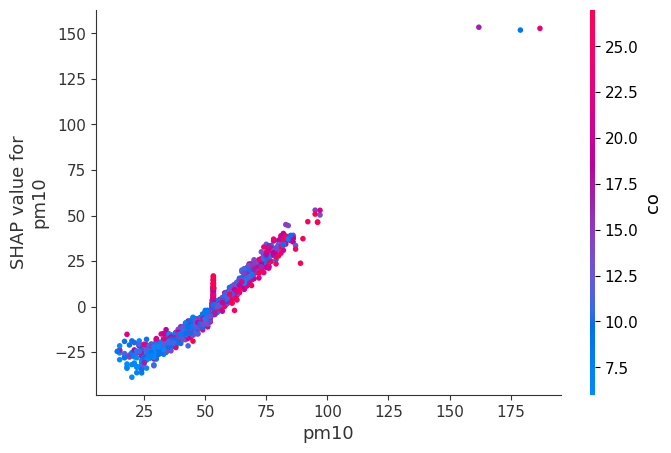

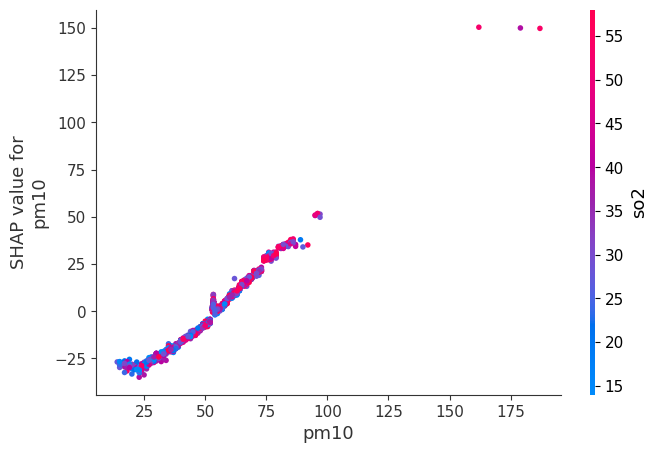

In [ ]:
# Model Random Forest Default

# 5. Inisialisasi model Random Forest dengan parameter default
model = RandomForestRegressor()
# Parameter
print("=== Parameter Random Forest yang Digunakan ===")
print(model.get_params())

start_time_rf = time.time()

# 6. Melatih model
model.fit(X_train, y_train)

# 7. Prediksi menggunakan model
y_pred = model.predict(X_test)

time_rf = time.time() - start_time_rf
print(f'Processing Time: {time_rf} seconds')

# 9. Menyusun kembali data untuk perbandingan
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})
print(comparison_df)

# 10. Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.3, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### XGB GS

Best Parameters:  {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
XGBoost - Processing Time: 31.393006324768066 seconds
      Actual PM2.5  Predicted PM2.5  Difference
1486     86.000000        91.606224    5.606224
2497     74.000000        73.428459   -0.571541
679     100.000000        97.713310   -2.286690
1710     83.000000        91.661804    8.661804
1974     80.000000        77.986473   -2.013527
...            ...              ...         ...
980      94.000000        80.325600  -13.674400
3656     78.189897        88.948120   10.758223
2546     73.000000        59.351433  -13.648567
899      95.000000        84.624573  -10.375427
1136     91.000000        85.465508   -5.534492

[1752 rows x 3 columns]
RMSE: 13.24
R-squared: 0.66


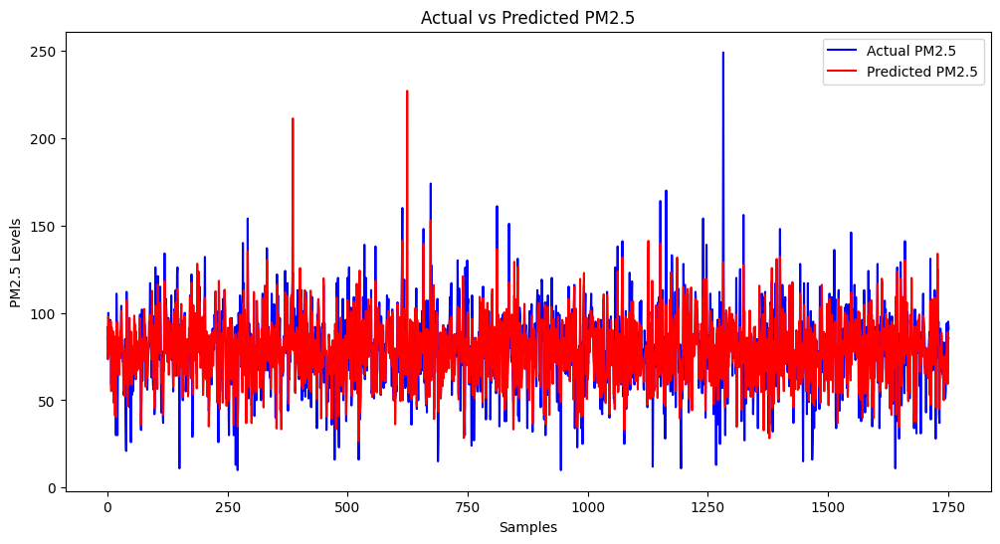


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      103.852966
1 2024-08-02      109.915192
2 2024-08-03      110.112274


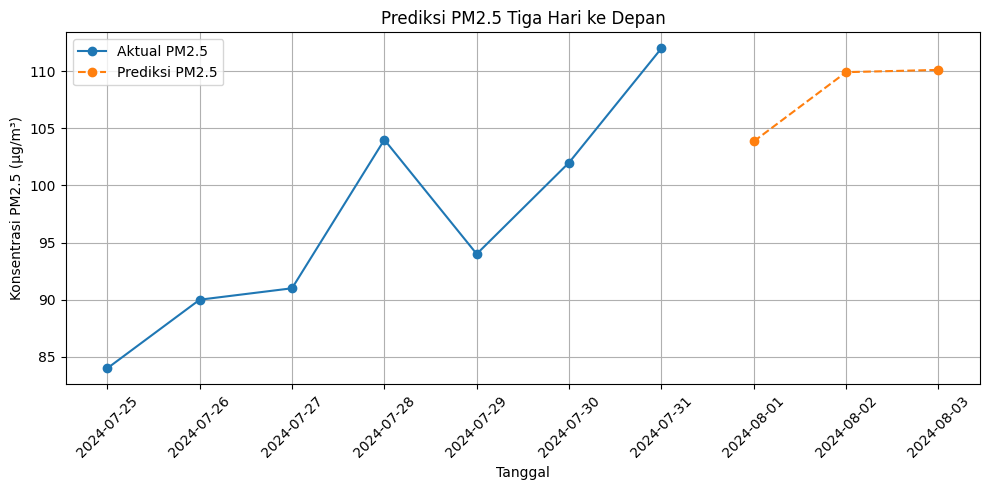

SHAP values shape: (1752, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.608914
so2      3.370973
o3       2.214311
co       1.870888
no2      1.181359
dtype: float32


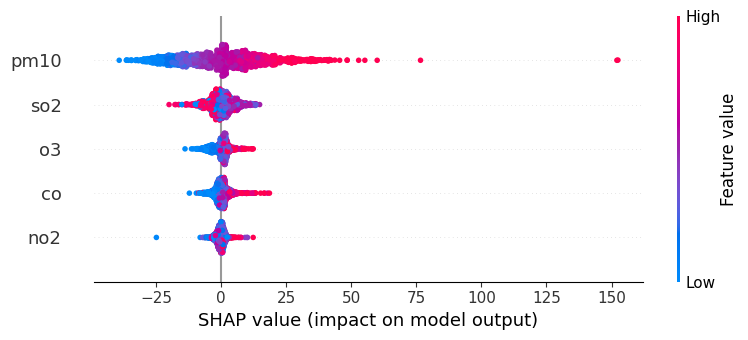

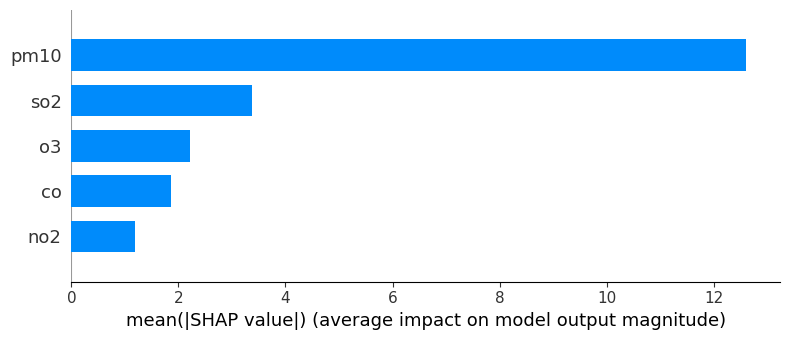

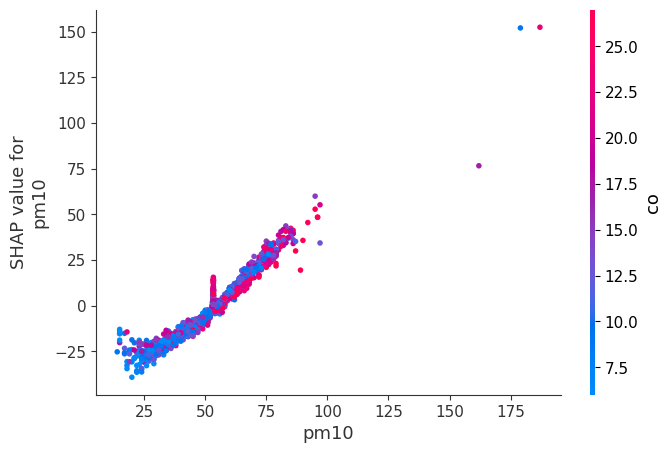

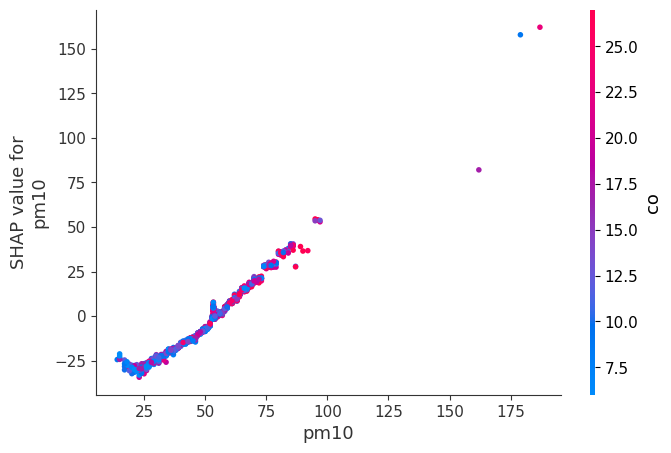

In [ ]:
# Model XGBoost With GS

# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5,7,9],
    'learning_rate': [0.1, 0.15],
}

start_time_xgb = time.time()

# 7. Inisialisasi model XGBoost
model = XGBRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv= 10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model XGBoost dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_xgb = time.time()  # Akhiri waktu untuk XGBoost
time_xgb = end_time_xgb - start_time_xgb
print(f'XGBoost - Processing Time: {time_xgb} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.3, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

### RF GS

Best Parameters:  {'max_depth': 9, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}
Random Forest - Processing Time: 254.55878615379333 seconds
      Actual PM2.5  Predicted PM2.5  Difference
1486     86.000000        91.804226    5.804226
2497     74.000000        70.940695   -3.059305
679     100.000000        95.446452   -4.553548
1710     83.000000        92.310391    9.310391
1974     80.000000        81.237658    1.237658
...            ...              ...         ...
980      94.000000        81.478985  -12.521015
3656     78.189897        87.551631    9.361735
2546     73.000000        53.682118  -19.317882
899      95.000000        81.430257  -13.569743
1136     91.000000        84.430822   -6.569178

[1752 rows x 3 columns]
RMSE: 13.74
R-squared: 0.64


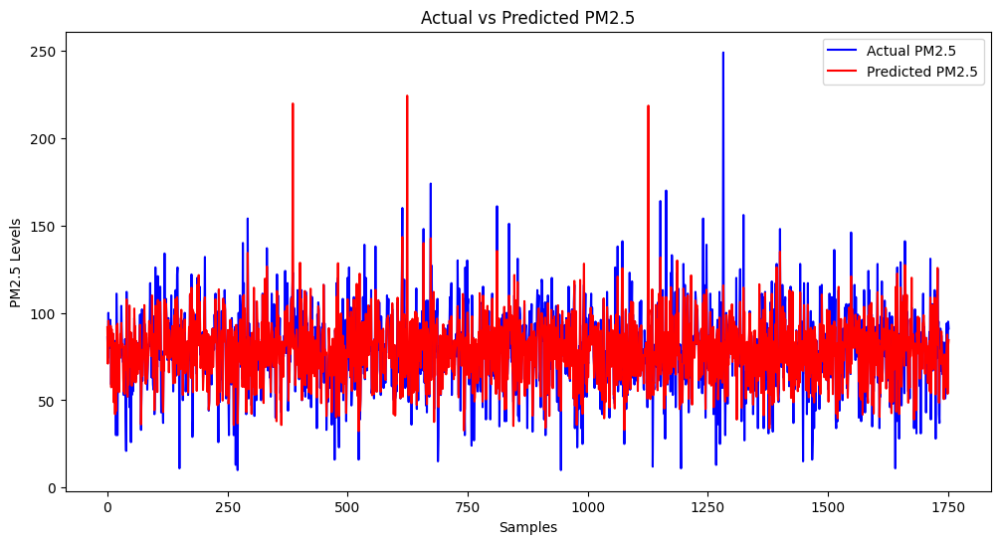


=== Prediksi PM2.5 3 Hari ke Depan ===
     Tanggal  Prediksi PM2.5
0 2024-08-01      103.852966
1 2024-08-02      109.915192
2 2024-08-03      110.112274


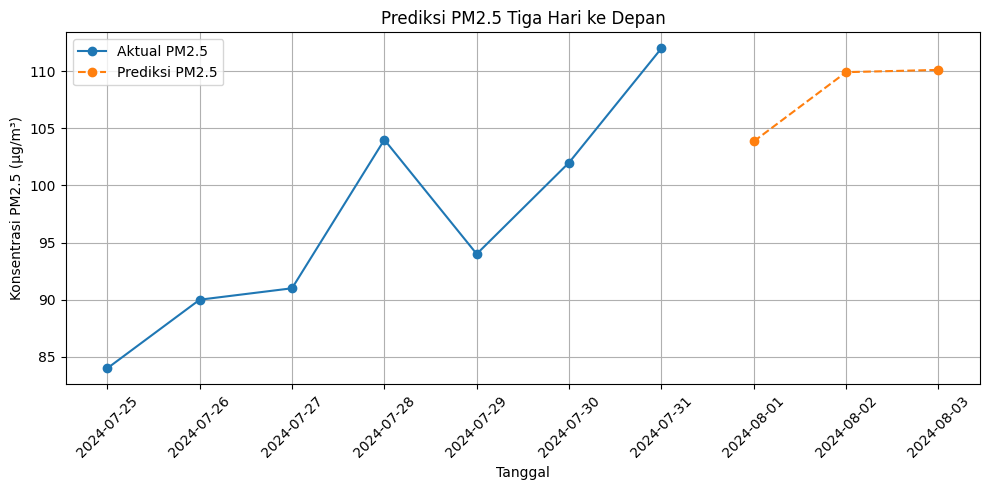

SHAP values shape: (1752, 5)
=== Rata-rata Pengaruh Fitur (SHAP Values) ===
pm10    12.664121
so2      2.988479
o3       1.970529
co       1.672267
no2      0.863955
dtype: float64


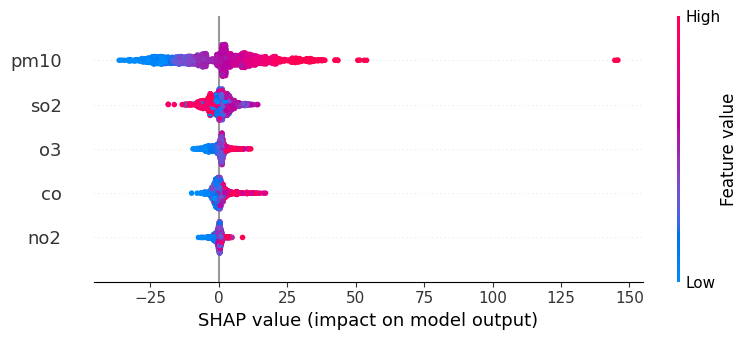

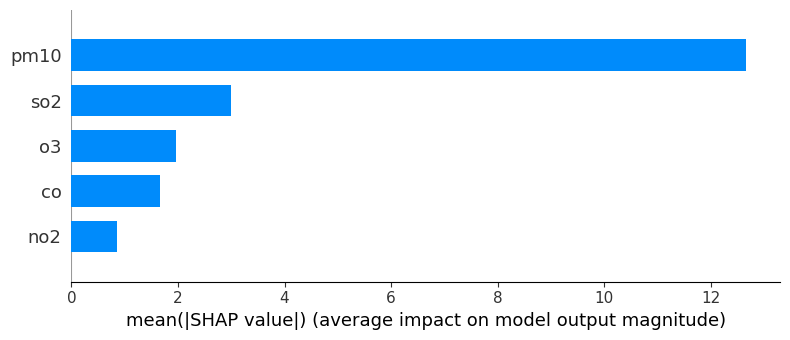

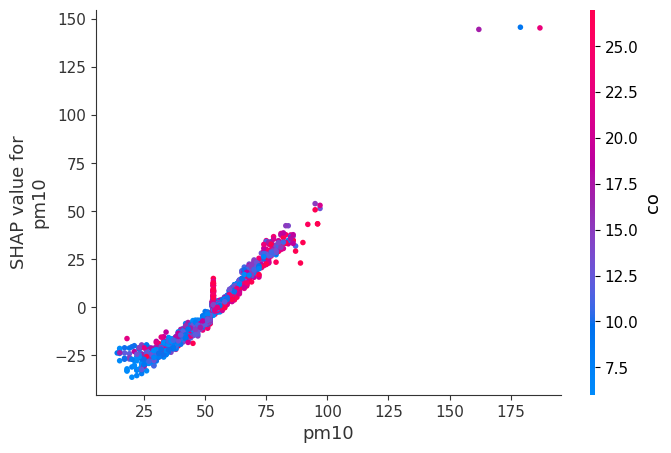

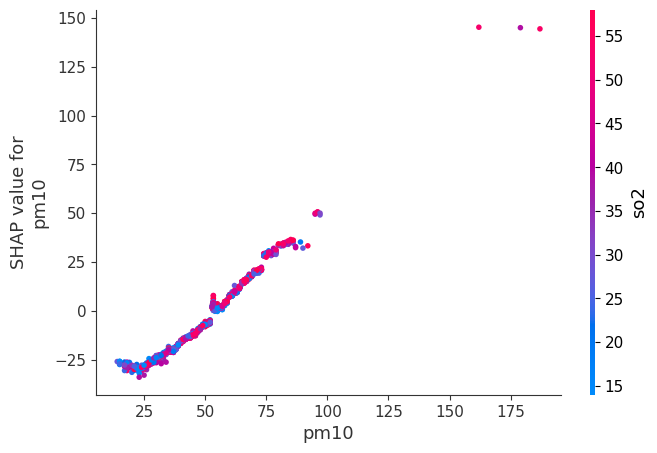

In [ ]:
#Model RF + GS

# 6. Mendefinisikan parameter untuk Grid Search
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5,7,9],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

start_time_rf = time.time()

# 7. Inisialisasi model Random Forest
model = RandomForestRegressor()

# 8. Inisialisasi Grid Search dengan Cross-Validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10)

# 9. Fit Grid Search
grid_search.fit(X_train, y_train)

# 10. Tampilkan parameter terbaik
print("Best Parameters: ", grid_search.best_params_)

# 11. Membangun model Random Forest dengan parameter terbaik
best_model = grid_search.best_estimator_

# 12. Prediksi menggunakan model terbaik
y_pred = best_model.predict(X_test)

# 14. Menghitung waktu proses
end_time_rf = time.time()  # Akhiri waktu untuk Random Forest
time_rf = end_time_rf - start_time_rf
print(f'Random Forest - Processing Time: {time_rf} seconds')

# 15. Menyusun kembali data untuk perbandingan nilai sebenarnya dan prediksi
comparison_df = pd.DataFrame({
    'Actual PM2.5': y_test,
    'Predicted PM2.5': y_pred,
    'Difference': y_pred - y_test
})

# 16. Tampilkan perbandingan nilai aktual dan prediksi
print(comparison_df)

# Misalnya data actual dan forecast
actual = comparison_df['Actual PM2.5']  # Contoh data actual
forecast = comparison_df['Predicted PM2.5']  # Contoh data forecast

# Menghitung MAPE
rmse_value = np.sqrt(mean_squared_error(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5']))
r2_value = r2_score(comparison_df['Actual PM2.5'], comparison_df['Predicted PM2.5'])
print(f'RMSE: {rmse_value:.2f}')
print(f'R-squared: {r2_value:.2f}')

# 17. Visualisasi hasil prediksi PM2.5
plt.figure(figsize=(12, 6))
plt.plot(comparison_df['Actual PM2.5'].reset_index(drop=True), label='Actual PM2.5', color='blue')
plt.plot(comparison_df['Predicted PM2.5'].reset_index(drop=True), label='Predicted PM2.5', color='red')
plt.title('Actual vs Predicted PM2.5')
plt.xlabel('Samples')
plt.ylabel('PM2.5 Levels')
plt.legend()
plt.show()

# Prediksi PM2.5 3 Hari ke Depan Menggunakan Lag-based
df_lag = data[['tanggal', 'pm2.5']].copy()
df_lag['lag_1'] = df_lag['pm2.5'].shift(1)
df_lag['lag_2'] = df_lag['pm2.5'].shift(2)
df_lag['lag_3'] = df_lag['pm2.5'].shift(3)
df_lag.dropna(inplace=True)

X_lag = df_lag[['lag_1', 'lag_2', 'lag_3']]
y_lag = df_lag['pm2.5']
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test_split(X_lag, y_lag, test_size=0.3, shuffle=False)

model_lag = XGBRegressor()
model_lag.fit(X_train_lag, y_train_lag)

last_values = list(df_lag['pm2.5'].values[-3:])
future_predictions = []
for i in range(3):
    input_lag = np.array(last_values[-3:]).reshape(1, -1)
    next_pred = model_lag.predict(input_lag)[0]
    future_predictions.append(next_pred)
    last_values.append(next_pred)

last_date = df_lag['tanggal'].iloc[-1]
future_dates_lag = [last_date + pd.Timedelta(days=i) for i in range(1, 4)]
future_lag_df = pd.DataFrame({
    'Tanggal': future_dates_lag,
    'Prediksi PM2.5': future_predictions
})
print("\n=== Prediksi PM2.5 3 Hari ke Depan ===")
print(future_lag_df)

# Visualisasi
plt.figure(figsize=(10,5))
plt.plot(df_lag['tanggal'].tail(7), df_lag['pm2.5'].tail(7), marker='o', label='Aktual PM2.5')
plt.plot(future_lag_df['Tanggal'], future_lag_df['Prediksi PM2.5'], marker='o', linestyle='--', label='Prediksi PM2.5')
plt.title('Prediksi PM2.5 Tiga Hari ke Depan')
plt.xlabel('Tanggal')
plt.ylabel('Konsentrasi PM2.5 (µg/m³)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values (Ensure correct index access here)
shap_values = explainer.shap_values(X_test)

# Debugging: Check the shape of SHAP values
print("SHAP values shape:", np.array(shap_values).shape)

shap_df = pd.DataFrame(shap_values, columns=X_test.columns)
shap_mean = shap_df.abs().mean().sort_values(ascending=False)
print("=== Rata-rata Pengaruh Fitur (SHAP Values) ===")
print(shap_mean)

# If SHAP values are returned as a list (for multi-output models), use indexing to access the correct array.
if isinstance(shap_values, list):
    shap_values = shap_values[0]  # Access the first element (for regression tasks, there is usually one output)

# Plot SHAP values
shap.summary_plot(shap_values, X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")

# SHAP Dependence Plot for a particular feature (e.g., 'pm10')
shap.dependence_plot("pm10", shap_values, X_test)

# SHAP Interaction Values
shap_interaction_values = explainer.shap_interaction_values(X_test)

# SHAP Interaction Values: Extract interaction values for "pm10" (or any other feature)
pm10_index = X_test.columns.get_loc("pm10")
interaction_values_for_pm10 = shap_interaction_values[:, pm10_index, :]

# Plot SHAP dependence plot for feature "pm10" with interaction values
shap.dependence_plot("pm10", interaction_values_for_pm10, X_test)

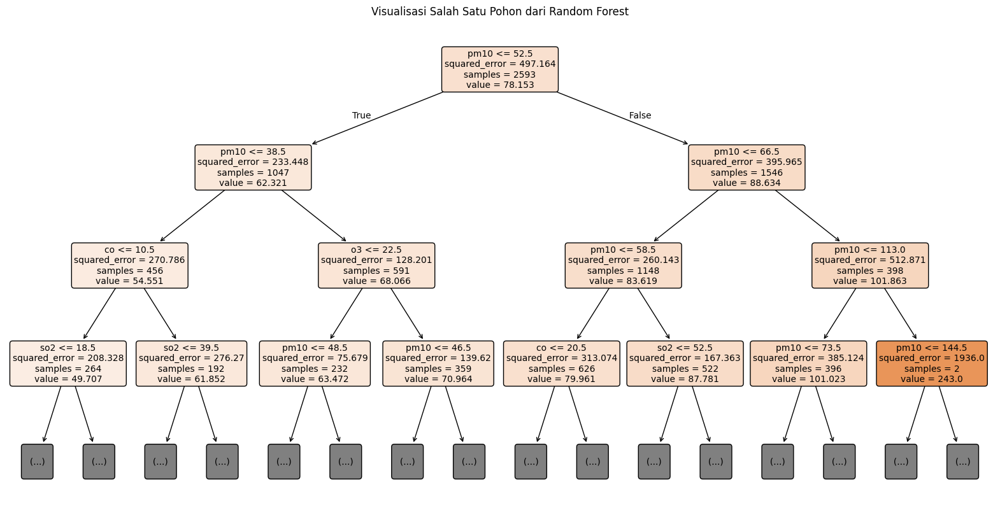

In [ ]:
from sklearn.tree import plot_tree
# 5. Melatih model Random Forest
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# 6. Visualisasi salah satu pohon dalam Random Forest
plt.figure(figsize=(20, 10))
plot_tree(rf_model.estimators_[0],  # ambil pohon ke-1 dari forest
          feature_names=X_train.columns,
          filled=True,
          rounded=True,
          max_depth=3,  # atur kedalaman agar tidak terlalu besar
          fontsize=10)
plt.title("Visualisasi Salah Satu Pohon dari Random Forest")
plt.savefig("pohon_random_forest.png", dpi=300, bbox_inches='tight')  # simpan
plt.show()  # menampilkan

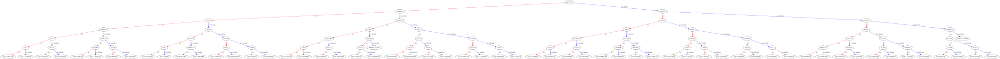

In [ ]:
from xgboost import XGBRegressor, to_graphviz
import graphviz

# Melatih model
xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)

# Konversi pohon ke-0 ke format DOT (Graphviz)
dot = to_graphviz(xgb_model, num_trees=0)

# Simpan sebagai file PNG
dot.render(filename="tree0", format="png", cleanup=True)

# (Opsional) Tampilkan objek graphviz di Jupyter Notebook
dot